# DTSA 5510 Final Project
---

This repository is for the DTSA 5510 Unsupervised Learning course's final project. It applies unsupervised learning methods to image recognition problems and compares them with supervised learning methods.

The data comes from the Kaggle dataset [Animals](https://www.kaggle.com/datasets/antobenedetti/animals/data), which contains about 15k pictures of animals in five categories: cats, dogs, elephants, horses, and lions. The training set consists of 13,474 images including .jpg, .jpeg, .png files, while the validation set contains 1,497 images.

This notebook covers EDA, Data Cleaning, Feature Extraction(color histogram, grayscale texture, VGG16), Dimension Reduction (using PCA and t-SNE), Modeling (with K-means, Agglomerative Clustering; and k-NN, SVM), and Tuning (Grid Search, Baysian Optimization). Metrics used include accuracy, f1 score and confusion matrix.

## Import

In [1]:
import os
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt
import seaborn as sns

from PIL import Image
from skimage.color import rgb2hsv, rgb2gray
from skimage.feature import graycomatrix, graycoprops
from skimage.io import imread
from skimage.transform import resize

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from keras.applications.vgg16 import preprocess_input
#from tensorflow.keras.models import Model
from keras.models import Model
from keras.layers import GlobalAveragePooling2D
import cv2

import torch
from torchvision import models, transforms

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D 

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

import itertools
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

import itertools
from hyperopt import hp
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
#from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.utils import check_random_state

SEED = 2004
# np.random.seed(SEED)
# random.seed(SEED)

2024-02-28 13:57:35.743566: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# EDA
------------

In [2]:
# Function to display random images from each category
def random_images_display(base_path, categories, num_images=8):
    for category in categories:
        path = os.path.join(base_path, category)
        images = os.listdir(path)
        selected_images = random.sample(images, num_images)
        fig, axs = plt.subplots(1, num_images, figsize=(16, 2.5))
        fig.suptitle(category)
        for i, img_name in enumerate(selected_images):
            img_path = os.path.join(path, img_name)
            img = plt.imread(img_path)
            axs[i].imshow(img)
            axs[i].set_title(img_name) 
            axs[i].axis('off')
        plt.show()


In [2]:
# set the train path and get the categories
train_path = 'data_animals/train'
categories = [d for d in os.listdir(train_path) if os.path.isdir(os.path.join(train_path, d))]

# display random images from each category
random_images_display(train_path, categories)


NameError: name 'random_images_display' is not defined

In [4]:
# Function to count the number of files in each directory
def count_files_in_directory(directory):
    total_files = 0
    other_files = 0
    file_types = set()
    for root, dirs, files in os.walk(directory):
        for file in files:
            _, ext = os.path.splitext(file)
            file_types.add(ext.lower()) 
            if ext.lower() in ['.jpg', '.png', '.jpeg']:
                total_files += 1
            else:
                other_files += 1
        print(f"root: {root}, dirs: {len(dirs)}, files: {len(files)}")
    # print('')
    # print(f"Found file types: {file_types}") # inspect if there are other file types
    print('')
    print(f"Total image files (.jpg, .png, jpeg): {total_files}")
    # print(f'Other files: {other_files}')


In [5]:
# count the number of files in each directory
count_files_in_directory(train_path)


root: data_animals/train, dirs: 5, files: 1
root: data_animals/train/cat, dirs: 0, files: 2737
root: data_animals/train/dog, dirs: 0, files: 2627
root: data_animals/train/horse, dirs: 0, files: 2705
root: data_animals/train/lion, dirs: 0, files: 2675
root: data_animals/train/elephant, dirs: 0, files: 2730

Total image files (.jpg, .png, jpeg): 13474


### Create Images Path File

In [13]:
# Function to create a csv file with image paths, image names and labels
def create_csv_for_images(base_path, csv_name='images_labels.csv'):
    categories = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
    data = []
    invalid_images = []
    
    for category in categories:
        path = os.path.join(base_path, category)
        images = os.listdir(path)
        for img in images:
            _, ext = os.path.splitext(img)
            if ext.lower() in ['.png', '.jpg', '.jpeg']: # check if the file is an image
                img_path = os.path.join(path, img)
                # check if the image is valid
                try:
                    with Image.open(img_path) as im:
                        im.verify()  
                        data.append([img_path, img, category])
                except (IOError, SyntaxError) as e:
                    invalid_images.append(img_path)
                    
    df = pd.DataFrame(data, columns=['img_path', 'img_name', 'label'])
    df.to_csv(os.path.join(base_path, csv_name), index=False)

    # if there are invalid images, print them
    if invalid_images:
        print("Invalid image files:")
        for img in invalid_images:
            print(img)

In [ ]:
# create the csv file
create_csv_for_images(train_path, 'images_labels.csv')


In [6]:
# Load the csv file
images_csv = pd.read_csv(os.path.join(train_path, 'images_labels.csv'))
images_csv.shape

(13474, 3)

In [9]:
images_csv.head()

,img_path,img_name,label
0,data_animals/train/cat/cat1594.jpg,cat1594.jpg,cat
1,data_animals/train/cat/cat108.jpg,cat108.jpg,cat
2,data_animals/train/cat/cat2089.jpg,cat2089.jpg,cat
3,data_animals/train/cat/cat1580.jpg,cat1580.jpg,cat
4,data_animals/train/cat/cat652.jpg,cat652.jpg,cat


In [10]:
# Check the number of images in each category
images_csv['label'].value_counts()

label
cat         2737
elephant    2730
horse       2705
lion        2675
dog         2627
Name: count, dtype: int64

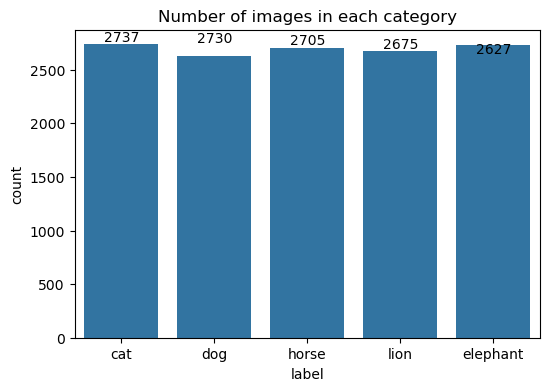

In [11]:
# plot the number of images in each category, mark the number of images in each category
plt.figure(figsize=(6, 4))
sns.countplot(data=images_csv, x='label')
plt.title('Number of images in each category')
for i, count in enumerate(images_csv['label'].value_counts()):
    plt.text(i, count, count, ha = 'center', va = 'bottom')
plt.show()


The number of data points in each category is roughly equal, constituting a balanced dataset.

In [12]:
# inspect the first image
image = Image.open(images_csv['img_path'][0])
image_np = np.array(image)
print(f"Image shape: {image_np.shape}, Image dimensions: {image_np.ndim}, Image size: {image_np.size}")

Image shape: (512, 512, 3), Image dimensions: 3, Image size: 786432


In [13]:
# inspect the shape of all images
image_shapes = {}
for img_path in images_csv['img_path']:
    with Image.open(img_path) as img:
        img_np = np.array(img)
        shape = img_np.shape 
        if shape not in image_shapes:
            image_shapes[shape] = 1
        else:
            image_shapes[shape] += 1

# count the number of images with the same shape
for shape, count in image_shapes.items():
    print(f'Shape: {shape}, Count: {count}')
    

Shape: (512, 512, 3), Count: 5364
Shape: (1024, 767, 3), Count: 1
Shape: (194, 259, 3), Count: 122
Shape: (184, 274, 3), Count: 19
Shape: (1024, 741, 3), Count: 1
Shape: (64, 64, 3), Count: 4650
Shape: (1024, 768, 3), Count: 35
Shape: (3888, 2592, 3), Count: 2
Shape: (769, 982, 3), Count: 1
Shape: (1024, 733, 3), Count: 1
Shape: (1024, 682, 3), Count: 10
Shape: (1024, 882, 3), Count: 2
Shape: (683, 1024, 3), Count: 159
Shape: (183, 275, 3), Count: 373
Shape: (190, 265, 3), Count: 19
Shape: (1024, 683, 3), Count: 48
Shape: (1024, 680, 3), Count: 16
Shape: (960, 1280, 3), Count: 1
Shape: (984, 1024, 3), Count: 1
Shape: (768, 1024, 3), Count: 203
Shape: (719, 1024, 3), Count: 1
Shape: (225, 225, 3), Count: 122
Shape: (889, 1024, 3), Count: 1
Shape: (314, 345, 3), Count: 1
Shape: (168, 300, 3), Count: 275
Shape: (266, 190, 3), Count: 5
Shape: (640, 960, 3), Count: 2
Shape: (169, 299, 3), Count: 9
Shape: (374, 500, 3), Count: 4
Shape: (1024, 751, 3), Count: 2
Shape: (159, 318, 3), Count: 40

The images are of various sizes. Most have three channels, but found two images only have two channels.

## Data Cleaning

### Invalid Images

remove blank elements / invalid image files, which have only two channels.

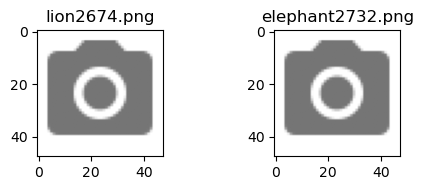

The current dataset has 13472 images


In [ ]:
# remove lion2674.png, elephant2732.png
# this images are blank elements / invalid images
blank_imgs = ['lion2674.png', 'elephant2732.png']

# show the images
fig, axs = plt.subplots(1, 2, figsize=(5, 2))
for i, img_name in enumerate(blank_imgs):
    img_path = images_csv[images_csv['img_name'] == img_name]['img_path'].values[0]
    img = plt.imread(img_path)
    axs[i].imshow(img)
    axs[i].set_title(img_name)
    axs
plt.tight_layout()
plt.show()

# remove the blank images
images_csv = images_csv[~images_csv['img_name'].isin(blank_imgs)]
print(f'The current dataset has {images_csv.shape[0]} images') # check if the images were removed

### Weird Images

The images below appear to be unusual, as they do not seem to correspond with their categories. Particularly for the category of elephants, there are many images of other animals, strange objects, or distant scenes. The categories of lions and horses show similar anomalies. In contrast, the images of cats and dogs are very consistent and clear.

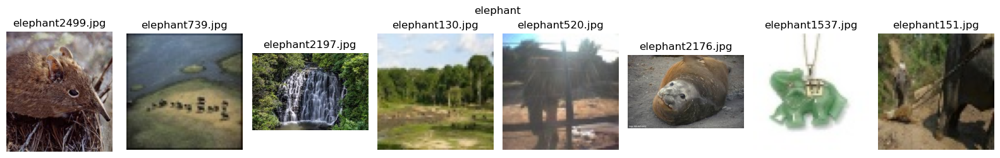

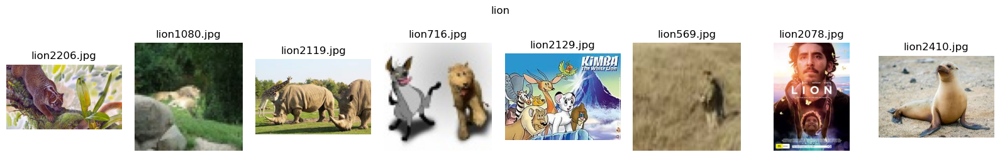

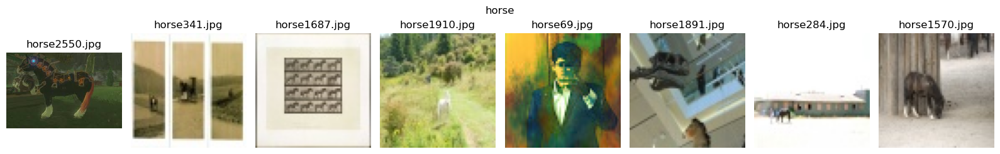

In [ ]:
# inspect directly from the image data, some images are not corresponding to the category
delete_dict = {'elephant': [65,78,129,130,151,169,196,233,238,255,283,305,310,317,322,343,380,409,489,520,677,739,749,820,901,1176,1349,1537,1624,1630,1761,1764,1855,1929,2176,2197,2322,2378,2489,2499,2609], 
               'lion': [131,290,321,569,573,584,588,679,694,716,899,1066,1080,1081,1791,1885,1953,2078,2119,2129,2188,2206,2232,2249,2253,2326,2335,2339,2408,2410,2557,2567,2594], 
               'horse': [69,284,341,1513,1570,1687,1705,1891,1910,1950,2160,2180,2215,2272,2488,2550,2634] }

# display the images to be deleted randomly
for category, indices in delete_dict.items():
    random_indices = random.sample(indices, min(len(indices), 8))  
    fig, axs = plt.subplots(1, len(random_indices), figsize=(16, 2.5)) 
    fig.suptitle(category)
    for idx, ax in zip(random_indices, axs.flatten()):
        pattern = rf"{category}{idx}\D"
        matched_images = images_csv[images_csv['img_name'].str.contains(pattern)]
        if not matched_images.empty:
            img_name = matched_images['img_name'].values[0]
            img_path = matched_images['img_path'].values[0]
            img = plt.imread(img_path)
            ax.imshow(img)
            ax.set_title(img_name)
        ax.axis('off') 
    plt.tight_layout()
    plt.show()

In [16]:
# delete these images in order not to confuse the model
for category, indices in delete_dict.items():
    for idx in indices:
        pattern = rf"{category}{idx}\D" # set the matching pattern
        images_csv = images_csv[~images_csv['img_name'].str.contains(pattern)]
    
print(f'the current dataset has {images_csv.shape[0]} images.')

the current dataset has 13381 images.


In [17]:
# check if the images were removed
images_csv[images_csv['img_name'].str.contains('elephant1630')]

,img_path,img_name,label


### Grayscale Images

In [18]:
# Function to check if there are grayscale images in the dataset
def check_grayscale_images_from_df(df):
    grayscale_images = []
    supported_extensions = ['.jpg', '.jpeg', '.png'] 

    for _, row in df.iterrows():
        file_path = row['img_path']
        _, ext = os.path.splitext(file_path)
        if ext.lower() in supported_extensions:
            try:
                with Image.open(file_path) as img:
                    if img.mode == 'L':
                        grayscale_images.append(file_path)
            except IOError:
                print(f"Cannot open the file: {file_path}")

    if grayscale_images:
        print("Found grayscale images:")
        for img_path in grayscale_images:
            print(img_path)
            
        print(f"Number of grayscale images: {len(grayscale_images)}")
    else:
        print("All images are colored.")

In [19]:
# check if there are grayscale images in the dataset
check_grayscale_images_from_df(images_csv)

All images are colored.


## Feature Extraction

### Color Histogram

A color histogram represents the distribution of colors in an image. It counts how many times each color appears in the image. This histogram is a visual tool that shows the intensity distribution of colors across an image, often separated into channels for Red-Green-Blue (RGB) or Hue-Saturation-Value (HSV) color space. Color histograms are useful for image processing tasks such as image segmentation, object recognition, and image enhancement because they provide a summary of the color distribution that can be analyzed to understand and manipulate images.

In [20]:
# Function of color histogram extraction using HSV color space
def color_histogram_extract(image_path):
    try:
        image = Image.open(image_path)
        image = np.array(image) / 255.0

        if image.ndim == 2:
            image = np.stack((image,)*3, axis=-1)
        elif image.shape[2] == 4:
            image = image[..., :3]

        image = rgb2hsv(image)
        
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None
    
    bins=128
    H_hist = np.histogram(image[:,:,0], bins=bins, range=(0, 1))[0]
    S_hist = np.histogram(image[:,:,1], bins=bins, range=(0, 1))[0]
    V_hist = np.histogram(image[:,:,2], bins=bins, range=(0, 1))[0]
    
    hist = np.concatenate((H_hist, S_hist, V_hist)).astype(np.float32)
    hist /= hist.sum()
    
    return hist


### Grayscale Texture

Grayscale texture analysis involves examining the texture of an image after converting it to grayscale. This approach simplifies the image by reducing it to a single intensity channel, which makes it easier to analyze patterns, contrasts, and textures within the image without the complexity of color. 

The code below converts images to grayscale and calculates the Gray Level Co-occurrence Matrix (GLCM), which is a statistical method of examining texture that considers the spatial relationship of pixels. The GLCM functions by examining the frequency at which different combinations of pixel brightness values (gray levels) occur in an image, positioned a certain distance apart. Texture features such as contrast, dissimilarity, homogeneity, energy, and correlation are extracted from the GLCM, providing informations to describe the texture of the image.

In [21]:
# Function to extract texture features using GLCM
def texture_features_extract(image_path):
    try:
        image = Image.open(image_path)
        image = np.array(image)

        if image.ndim == 2:
            image = np.stack((image,)*3, axis=-1)
        elif image.shape[2] == 4:
            image = image[..., :3]
            
        image = rgb2gray(image)
        image = (image * 255).astype('uint8')
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None
    
    distances = [1, 2, 3]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    glcm = graycomatrix(image, distances=distances, angles=angles, symmetric=True, normed=True)
    
    contrast = graycoprops(glcm, prop='contrast')
    dissimilarity = graycoprops(glcm, prop='dissimilarity')
    homogeneity = graycoprops(glcm, prop='homogeneity')
    energy = graycoprops(glcm, prop='energy')
    correlation = graycoprops(glcm, prop='correlation')

    features = np.array([contrast, dissimilarity, homogeneity, energy, correlation]).flatten()
    
    return features

### Feature Extraction Combination

Explore whether combining color histogram and texture feature extraction could yield better results.

In [22]:
def combined_features_extract(image_path):
    
    color_features = color_histogram_extract(image_path)
    texture_features = texture_features_extract(image_path)
    
    if texture_features is not None and color_features is not None:
        combined_features = np.concatenate([texture_features, color_features])
        return combined_features
    else:
        return None


### VGG16

VGG16 is a deep learning method for computer vision tasks, consisting of 16 weight layers, including 13 convolutional layers and 3 fully connected layers. It uses multiple small convolutional filters (3x3), which allowed for the learning of more complex feature representations while maintaining a relatively shallow network depth.

Below, I attempt to implement VGG16 feature extraction using both Keras and PyTorch. Due to differences in implementation details, the results may vary, but I expect the performance to be similar.

#### VGG16, Keras

In [23]:
# Function of VGG16 feature extraction using Keras
def vgg16_feature_extract_keras(image_path, model):
    
    img = load_img(image_path, target_size=(256, 256)) # resize the image to 256x256
    img = img_to_array(img)
    img = img.astype('uint8')
    
    center_x, center_y = img.shape[1] // 2, img.shape[0] // 2
    crop_size = 112  # in order to crop the image to 224x224, the center crop size is 112
    img = img[center_y - crop_size:center_y + crop_size, center_x - crop_size:center_x + crop_size]

    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img) # include normalization and channel-wise mean subtraction
    features = model.predict(img, verbose=0)
    
    return features.flatten()



#### VGG16, PyTorch


In [7]:
# Function of VGG16 feature extraction using PyTorch
def vgg16_feature_extract_pt(image_path, model):
    transform = transforms.Compose([
        transforms.Resize(256), # resize the image to 256x256
        transforms.CenterCrop(224), # crop the image to 224x224 around the center
        transforms.ToTensor(), # convert the image to a PyTorch tensor
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), # normalize the image
    ])
    img = Image.open(image_path).convert("RGB") 
    img = transform(img).unsqueeze(0)
    model.eval() # set evaluatoin mode for extracting features, not for training.
    with torch.no_grad(): 
        features = model(img)
    return features.squeeze(0) 


#### execute feature extraction methods

In [8]:
# Function to load images and extract features
def images_load_and_feature_extract(df, extract_method='color_histogram', model=None):
    features = []
    labels = []
    
    for _, row in df.iterrows():
        path = row['img_path']
        label = row['label']
        if os.path.exists(path) and os.path.splitext(path)[1].lower() in ['.jpg', '.jpeg', '.png']:
            if extract_method == 'color_histogram':
                fs = color_histogram_extract(path)
            elif extract_method == 'grayscale_texture':
                fs = texture_features_extract(path)
            elif extract_method == 'combined_features':
                fs = combined_features_extract(path)
            elif extract_method == 'VGG16_keras':
                fs = vgg16_feature_extract_keras(path, model)
            elif extract_method == 'VGG16_PT':
                fs = vgg16_feature_extract_pt(path, model)
            else:
                print(f"Invalid method: {extract_method}")
                return None, None
                
            if fs is not None:
                features.append(fs)
                labels.append(label)
            else:
                print(f"Skipping {path} due to error.")
        else:
            print(f"File not found or unsupported extension: {path}")
    
    return np.array(features), labels


In [26]:
# extract color histogram features
hist_fs, y = images_load_and_feature_extract(images_csv, 'color_histogram')
print(f'shape: {len(hist_fs), len(hist_fs[0])}')

shape: (13381, 384)


In [27]:
# extract texture features
texture_fs, y = images_load_and_feature_extract(images_csv, 'grayscale_texture')
print(f'shape: {len(texture_fs), len(texture_fs[0])}')

shape: (13381, 60)


In [28]:
# extract combined features
comb_fs, y = images_load_and_feature_extract(images_csv, 'combined_features')
print(f'shape: {len(comb_fs), len(comb_fs[0])}')

shape: (13381, 444)


In [29]:
# extract VGG16 features using Keras

model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = model.output
model_k = Model(inputs=model.input, outputs=x)

vgg16_k_fs, y = images_load_and_feature_extract(images_csv, 'VGG16_keras', model=model_k)
print(f'shape: {len(vgg16_k_fs), len(vgg16_k_fs[0])}')

shape: (13381, 25088)


In [9]:
# extract VGG16 features using PyTorch

model_pt = models.vgg16(pretrained=True)
# model_pt.classifier = torch.nn.Sequential(*list(model_pt.classifier.children())[:-1])
model_pt.classifier = model_pt.classifier[:-1]  # remove the last layer

vgg16_pt_fs, y = images_load_and_feature_extract(images_csv, 'VGG16_PT', model=model_pt)
print(f'shape: {len(vgg16_pt_fs), len(vgg16_pt_fs[0])}')

shape: (13474, 4096)


In [10]:
# Function for mapping the cluster labels to the original labels
# Compare the accuracy to find the best permutation
def label_permutation(true, pred):
    all_scores = []
    # labels = true.unique().tolist()
    labels = np.unique(true).tolist()
    
    for perm in itertools.permutations(range(len(labels))):
        # map_dict = dict(zip(labels, perm))
        # maped_true = true.map(map_dict)
        map_dict = {label: perm_i for label, perm_i in zip(labels, perm)}
        maped_true = np.vectorize(map_dict.get)(true)
        
        acc = accuracy_score(maped_true, pred)
        f1 = f1_score(maped_true, pred, average='weighted')
        all_scores.append([acc, f1, perm])
    
    best_score, best_f1 ,best_perm = max(all_scores, key=lambda x: x[0])
    # best_map_dict = dict(zip(labels, best_perm))
    # maped_true = true.map(best_map_dict)
    best_map_dict = {label: perm_i for label, perm_i in zip(labels, best_perm)}
    maped_true = np.vectorize(best_map_dict.get)(true)
    
    cm = confusion_matrix(maped_true, pred)
    best_labels = [label for label, perm_i in sorted(best_map_dict.items(), key=lambda x: x[1])]

    print(f'Best Accuracy: {best_score:.5f}')
    print(f'F1 Score: {best_f1:.5f}')  
    # print(f'Permutation: {best_perm}')
    print(f'Cluster 0 - {len(best_labels)-1} corresponding to labels: {best_labels}')

    return best_score, best_f1, best_labels, cm

In [11]:
# Function to plot the confusion matrix
def cm_plot(cm, labels=None):
    print('Confusion Matrix:')
    print(cm)
    
    norm_cm = cm / cm.sum(axis=1, keepdims=True)
    plt.figure(figsize=(5, 4))
    sns.heatmap(norm_cm, annot=True, fmt='.3f', cmap='Blues', 
                xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Unsupervised Clustering
---

## K-means

K-means is an unsupervised learning algorithm primarily for data clustering. The algorithm aims to partition n observations into k clusters, where each observation belongs to the cluster with the nearest mean (the cluster center), thus optimizing the sum of distances between observations and their respective cluster centers.

The code below executes K-means with different feature extraction methods.

Feature Extraction Method: Coloer Histogram
Cluster labels for method 1: [0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]


Best Accuracy: 0.28100
F1 Score: 0.22006
Cluster 0 - 4 corresponding to labels: ['horse', 'cat', 'dog', 'elephant', 'lion']
Silhouette Score: 0.14721
Confusion Matrix:
[[1984  187  271   30  216]
 [1536   74  644    6  477]
 [1540   71  659    1  356]
 [1506  101  455   70  556]
 [ 848   81  697   42  973]]


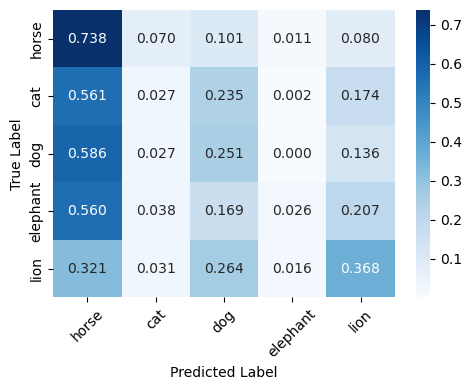


Feature Extraction Method: Grayscale Texture
Cluster labels for method 2: [3 3 3 ... 4 0 2]
[3 3 3 ... 4 0 2]
Best Accuracy: 0.34564
F1 Score: 0.28369
Cluster 0 - 4 corresponding to labels: ['lion', 'elephant', 'cat', 'dog', 'horse']
Silhouette Score: 0.47389
Confusion Matrix:
[[1031  840   41  440  289]
 [ 870  963   77  243  535]
 [ 712  201   10 1733   81]
 [ 308   43    1 2262   13]
 [ 789  650  122  768  359]]


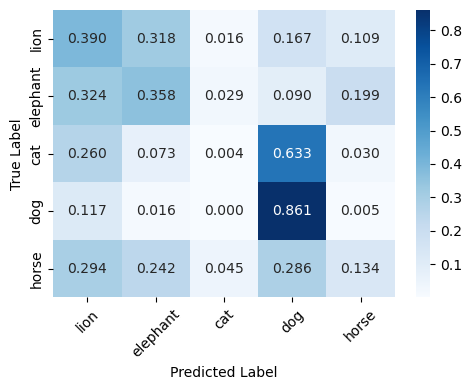


Feature Extraction Method: Combination of Histogram and Texture
Cluster labels for method 3: [3 3 3 ... 4 0 2]
[3 3 3 ... 4 0 2]
Best Accuracy: 0.34549
F1 Score: 0.28357
Cluster 0 - 4 corresponding to labels: ['lion', 'elephant', 'cat', 'dog', 'horse']
Silhouette Score: 0.47378
Confusion Matrix:
[[1028  843   41  440  289]
 [ 867  964   77  243  537]
 [ 713  202   10 1731   81]
 [ 307   44    1 2262   13]
 [ 789  651  122  767  359]]


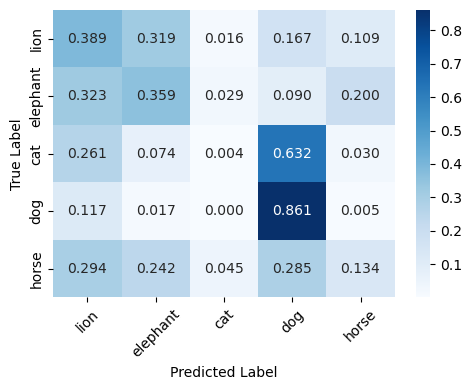


Feature Extraction Method: VGG16_Keras
Cluster labels for method 4: [3 3 3 ... 2 1 1]
[3 3 3 ... 2 1 1]
Best Accuracy: 0.67409
F1 Score: 0.62173
Cluster 0 - 4 corresponding to labels: ['lion', 'horse', 'elephant', 'cat', 'dog']
Silhouette Score: 0.10764
Confusion Matrix:
[[   0  733 1897    6    5]
 [   1 1711  976    0    0]
 [   0  684 2004    0    0]
 [   0   22    6 2709    0]
 [   0   27    4    0 2596]]


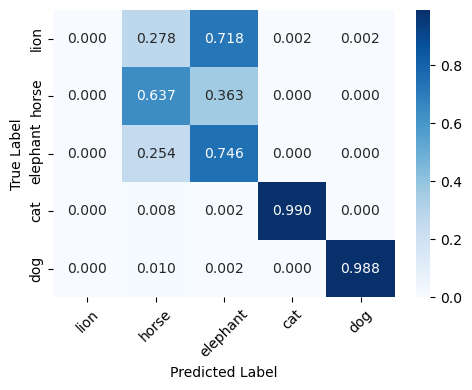


Feature Extraction Method: VGG16_PyTorch
Cluster labels for method 5: [3 3 3 ... 1 1 1]
[3 3 3 ... 1 1 1]
Best Accuracy: 0.85696
F1 Score: 0.85748
Cluster 0 - 4 corresponding to labels: ['horse', 'elephant', 'lion', 'cat', 'dog']
Silhouette Score: 0.12684
Confusion Matrix:
[[1665  908    4    0  111]
 [   3 2672    0    0   13]
 [   2  808 1778    1   52]
 [   0    0    2 2726    9]
 [   0    0    1    0 2626]]


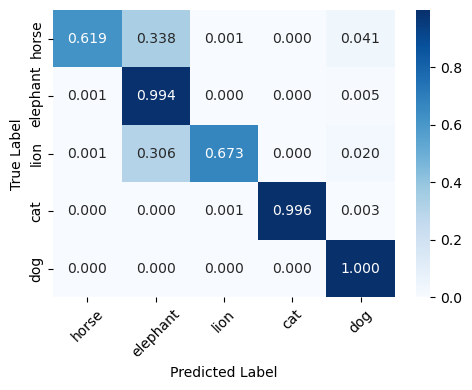

In [34]:
fs_list = [
    ("Coloer Histogram", hist_fs),
    ("Grayscale Texture", texture_fs),
    ("Combination of Histogram and Texture", comb_fs),
    ("VGG16_Keras", vgg16_k_fs),
    ("VGG16_PyTorch", vgg16_pt_fs)
]

for i, (name, fs) in enumerate(fs_list):
    kms = KMeans(n_clusters=5, random_state=SEED)
    kms.fit(fs)
    pred = kms.labels_
    print(f"Feature Extraction Method: {name}") 
    print(f"Cluster labels for method {i+1}:", pred)
    print(pred)
    best_score, _, best_labels, cm = label_permutation(y, pred)
    print(f'Silhouette Score: {silhouette_score(fs, pred):.5f}')
    cm_plot(cm, best_labels)
    print('')

### Comparison

These results above from applying different feature extraction methods combined with the **K-means** clustering algorithm 

1. **Color Histogram HSV** had a relatively low accuracy (0.28100) and F1 score (0.22006), indicating that using color histogram features alone is limited in classifying animal images. It was observed that images of horses were often confused with other categories, which might be due to the diversity in the color of horse images, covering color schemes that could appear in other categories.

2. **Grayscale Texture** method improved accuracy (0.34564) and F1 score (0.28369), showing that texture features positively impact classification performance. Cats and dogs are particularly prone to confusion, likely because the training images for these two animals have very similar compositions and outlines.

3. **Combining Color Histogram HSV and Grayscale Texture** resulted in performance very close to using Grayscale Texture alone, accuracy (0.34549) and F1 (0.28357), indicating that the additional color histogram features did not significantly enhance performance in this case.

4. **VGG16 with Keras** significantly improved accuracy (0.67409) and F1 score (0.62173), demonstrating the power of deep learning models in extracting complex features.

5. **VGG16 with PyTorch** achieved the highest accuracy (0.85696) and F1 score (0.85748), indicating significantly better performance under specific implementation and preprocessing details with deep learning models. The main classification error were with elephants, lions, and horses, as the training images for these categories are more chaotic, unlike the consistent images of cats and dogs. These findings are consistent with previous EDA results.

In summary, deep learning approaches using the VGG16 model, significantly outperform traditional feature extraction methods in animal image classification tasks. The VGG16 model implemented with PyTorch showed the best performance. These results highlight the importance of selecting appropriate feature extraction techniques.


| Feature Extraction Method              | Clustering/Classification Method |  Accuracy | F1 Score | 
|----------------------------------------|----------------------------------|----------|----------|
| Color Histogram HSV                    | K-means                          |  0.28100  | 0.22006  | 
| Grayscale Texture                      | K-means                          |  0.34564  | 0.28369  | 
| Color Histogram + Grayscale Texture    | K-means                          |  0.34549  | 0.28357  | 
| VGG16_Keras                            | K-means                          |  0.67409  | 0.62173  | 
| `VGG16_PyTorch`                          | `K-means`                          |  `0.85696`  | `0.85748`  | 



#### Images from each cluster

In [35]:
# show random images from each cluster
def random_images_from_clusters(csv_df, pred, best_labels=None):
    n_clusters = len(np.unique(pred))
    n_images = 8
    
    for i in range(n_clusters):
        cluster_indices = np.where(pred == i)[0]
        n_images_cluster = min(len(cluster_indices), n_images)
        if n_images_cluster == 0:
            continue
        
        fig, axs = plt.subplots(1, n_images_cluster, figsize=(16, 2.7))
        if best_labels is not None:
            fig.suptitle(f'Cluster {i} {best_labels[i]}')
        else:
            fig.suptitle(f'Cluster {i}')
            
        random_indices = np.random.choice(cluster_indices, n_images_cluster, replace=n_images_cluster > len(cluster_indices))
        for j, idx in enumerate(random_indices):
            img_path = csv_df.iloc[idx]['img_path'] 
            img = plt.imread(img_path)
            axs[j].imshow(img)
            axs[j].set_title(csv_df.iloc[idx]['img_name'])
            axs[j].axis('off')
            
    plt.tight_layout()
    plt.show()


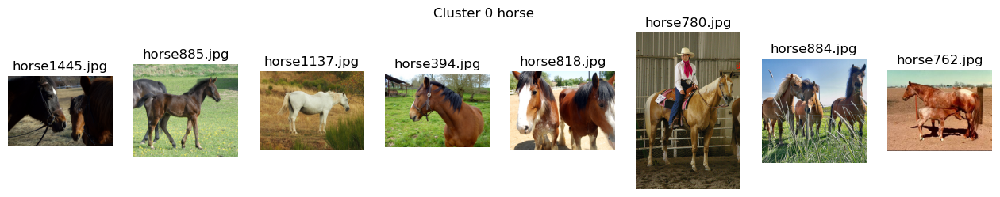

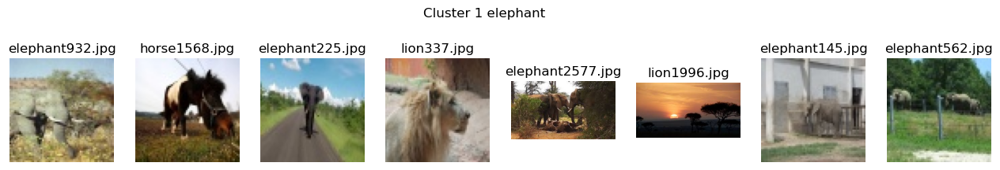

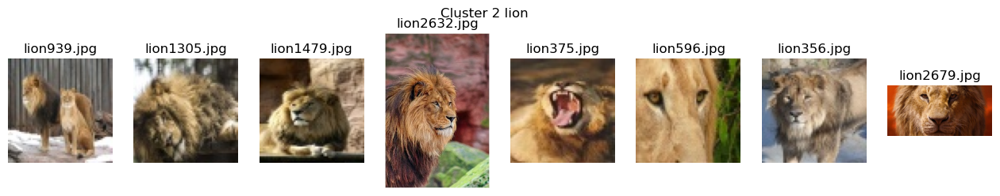

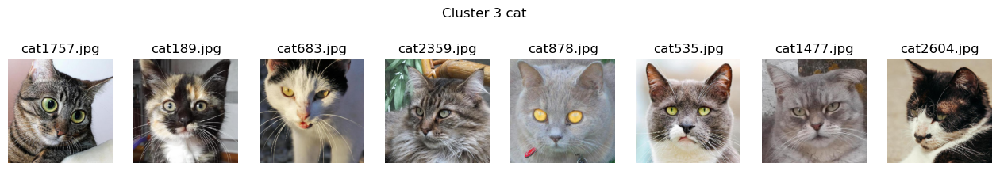

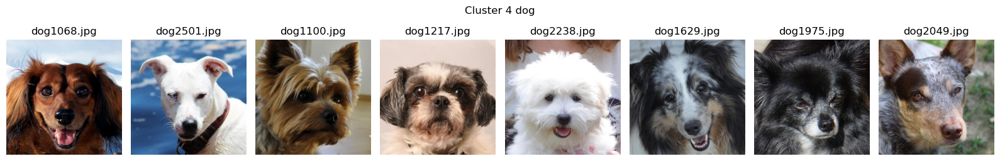

In [189]:
# display random images from each cluster obtained by K-means with VGG16, PyTorch
random_images_from_clusters(images_csv, pred, best_labels)

## Hierarchical Clustering

It is a method of cluster analysis to build a hierarchy of clusters. It involves creating a tree of clusters called a dendrogram, which allows visualizing the arrangement and relationship between data points. This method offers an intuitive understanding of the data's hierarchical structure. There are two main types of hierarchical clustering: Agglomerative (bottom-up approach) and Divisive (top-down approach).


Here I employ **Agglomerative Clustering**, and set n_cluster=5 because the dataset contains five categories. Agglomerative Clustering begins with each data point as an individual cluster and then computes the similarity between all pairs of clusters, merging the two most similar clusters into one new cluster. This process is repeated until all data points are merged into a single cluster or a stopping criterion is met. 

Best Accuracy: 0.77864
F1 Score: 0.76939
Cluster 0 - 4 corresponding to labels: ['elephant', 'cat', 'dog', 'horse', 'lion']
Sihouette Score: 0.13374
Confusion Matrix:
[[2676    0    0   12    0]
 [   0 2736    0    0    1]
 [   0    1 2622    3    1]
 [1077    0    7 1604    0]
 [1853    1    0    6  781]]


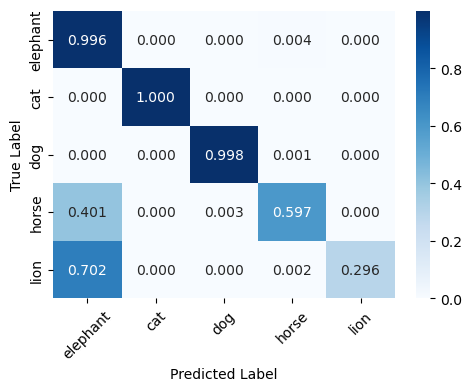

In [37]:
# use Agglomerative Clustering classify the images data vgg16_pt_fs
agg = AgglomerativeClustering(n_clusters=5)
agg.fit(vgg16_pt_fs)
pred = agg.labels_

best_score, _, best_labels, cm = label_permutation(y, pred)
print(f'Sihouette Score: {silhouette_score(vgg16_pt_fs, pred):.5f}')
cm_plot(cm, best_labels)

The accuracy (0.77864) and F1 score (0.76939) suggest that Agglomerative Clustering has performed well in distinguishing between the five animal categories, despite the noted confusions. The misclassifications, especially involving lions and horses point to the need for further refinement. In the following, dimensionality reduction and parameter tuning will be carried out.

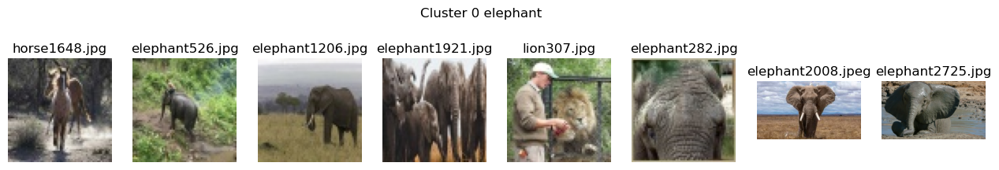

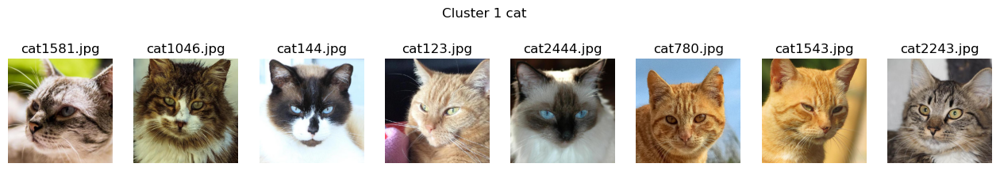

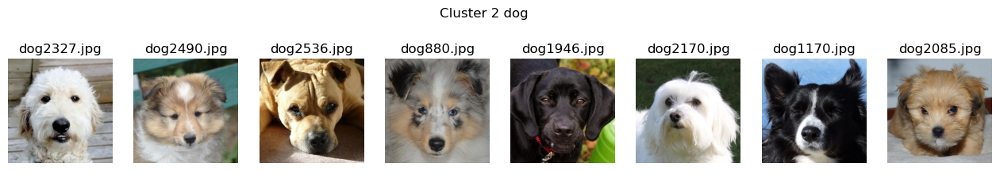

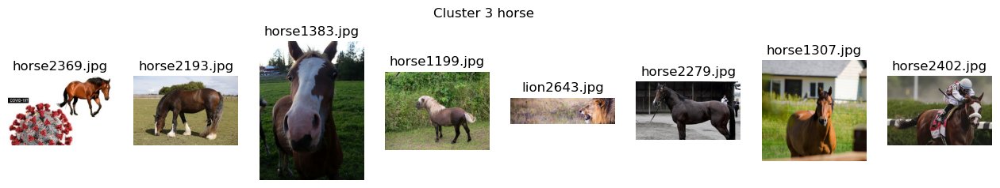

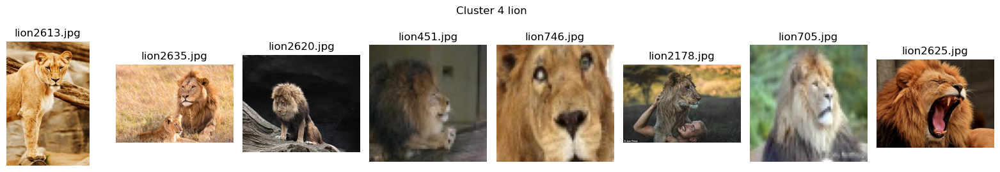

In [38]:
# display random images from each cluster obtained by Agglomerative Clustering
random_images_from_clusters(images_csv, pred, best_labels)

## DBSCAN

 **Density-Based Spatial Clustering of Applications with Noise (DBSCAN)** is a density-based clustering algorithm that can identify clusters of any shape and is resilient to noise. The idea of this algorithm is to analyze the density of points within their neighborhood, based on two key parameters: the radius ε (eps) and the minimum number of points (minPts). A point is considered a core point if it has at least minPts within its ε neighborhood. By connecting core points, DBSCAN effectively separates high-density areas from low-density areas, thus identifying clusters and noise (points that do not belong to any cluster).


 Since DBSCAN does not allow for the direct specification of n_clusters, I used NearestNeighbors to plot the relationship between data points and their nearest neighbors' distances for the feature data from vgg16_pt_fs. This was done to identify suitable values for the radius ε (eps) and the minimum number of points (minPts), aiming for the clustering to result in five clusters and one noise pile. I experimented with different combinations of eps and minPts. Although it did not accurately classify the five animal categories, it yielded interesting results.

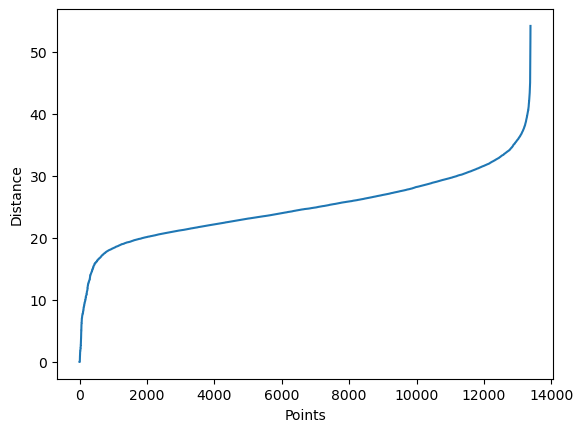

In [39]:
# plot the k nearest neighbors distance

nearest_neighbors = NearestNeighbors(n_neighbors=5)
nearest_neighbors.fit(vgg16_pt_fs)
distances, indices = nearest_neighbors.kneighbors(vgg16_pt_fs)
distances = np.sort(distances, axis=0)[:, 1]

plt.plot(distances)
plt.xlabel('Points')
plt.ylabel('Distance')
plt.show()


In [81]:
# I tried vaious combinations of eps and min_samples to obtain 6 clusters, including the noise cluster(-1)
# dbscan = DBSCAN(eps=30.5, min_samples=6)
dbscan = DBSCAN(eps=20.1, min_samples=11) 
pred = dbscan.fit_predict(vgg16_pt_fs)

uniq_pred = np.unique(pred)
n_clusters = len(uniq_pred)
print(f"Using DBSCAN obtained {n_clusters} clusters")
print("Cluster labels:", uniq_pred)

Using DBSCAN obtained 6 clusters
Cluster labels: [-1  0  1  2  3  4]


In [41]:
# print the number of images in each cluster
for i in range(-1, n_clusters-1):
    print(f"Cluster {i}: {np.sum(pred == i)} images")


Cluster -1: 12931 images
Cluster 0: 338 images
Cluster 1: 11 images
Cluster 2: 19 images
Cluster 3: 12 images
Cluster 4: 70 images


The results indicate that most of the images are classified as noise, DBSCAN is a density-based clustering method, which not only requires further research for appropriate feature extraction and identification of suitable eps and min_samples values but also reflects the diversity and dispersion of animal image data. Images of different individuals or postures of the same species may exhibit considerable variation in feature space, which could lead to unsatisfactory clustering results.

In [42]:
# Here need to plus 1 for the pred, due to the function's limitation in displaying the images
pred += 1

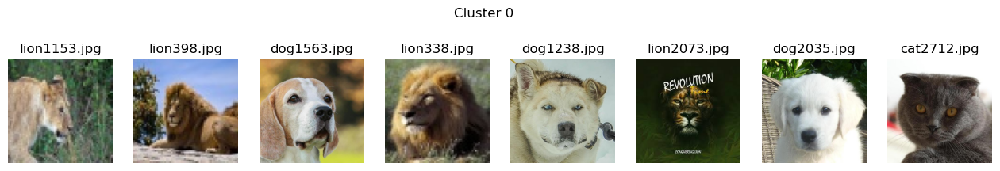

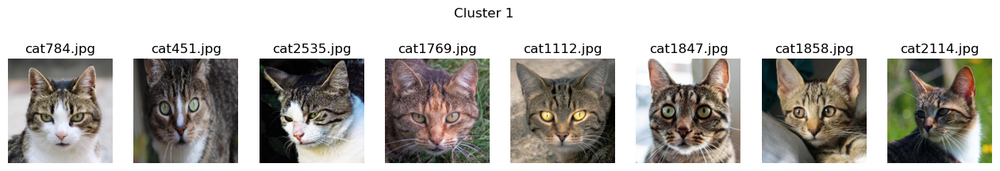

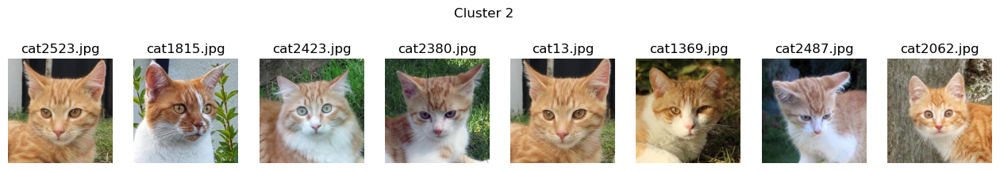

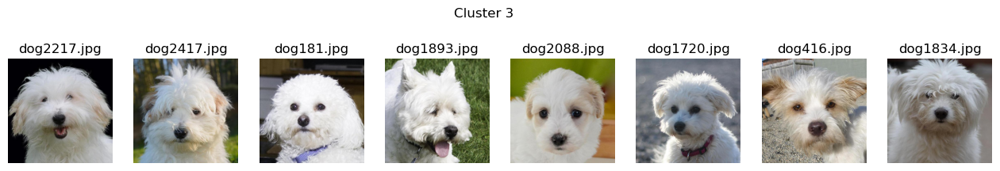

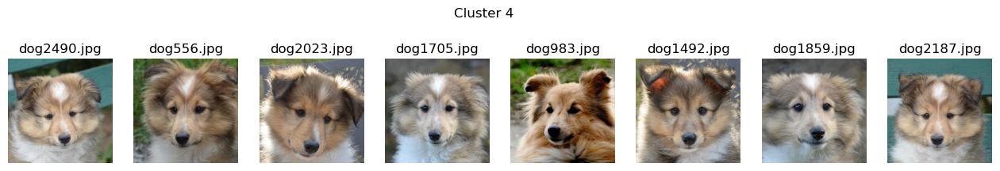

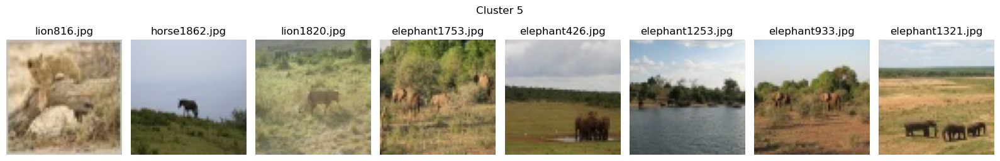

In [43]:
# display random images from each cluster, here cluster 0 is the noise cluster(-1).
random_images_from_clusters(images_csv, pred)

From the images displayed, it can be observed that DBSCAN can accurately identify extremely similar colors and patterns, but it struggles to distinguish the diversity within the same species.

## Dimension Reduction

In order to preserve the main information while reducing computational complexity and avoiding the curse of dimensionality, as well as to facilitate effective visualization, the methods of PCA and t-SNE are implemented.

### PCA

**Principal Component Analysis (PCA)** is a linear dimensionality reduction technique. It identifies the directions of maximum variance in the data and project the data onto these directions to reduce its dimensions. PCA can transform data from a high-dimensional space to a lower-dimensional space with minimal loss of information.

**K-Means + PCA**
The code below inspect how the performance of animal image classification using the K-means varies with changes in PCA n_components. The number presents the percentage of features's variance retained.

PCA n_components: 0.07
Number of features: 2
Best Accuracy: 0.64569
F1 Score: 0.61729
Cluster 0 - 4 corresponding to labels: ['horse', 'dog', 'elephant', 'lion', 'cat']

PCA n_components: 0.08
Number of features: 2
Best Accuracy: 0.64569
F1 Score: 0.61729
Cluster 0 - 4 corresponding to labels: ['horse', 'dog', 'elephant', 'lion', 'cat']

PCA n_components: 0.09
Number of features: 2
Best Accuracy: 0.64569
F1 Score: 0.61729
Cluster 0 - 4 corresponding to labels: ['horse', 'dog', 'elephant', 'lion', 'cat']

PCA n_components: 0.09999999999999999
Number of features: 2
Best Accuracy: 0.64569
F1 Score: 0.61729
Cluster 0 - 4 corresponding to labels: ['horse', 'dog', 'elephant', 'lion', 'cat']

PCA n_components: 0.10999999999999999
Number of features: 3
Best Accuracy: 0.90569
F1 Score: 0.90649
Cluster 0 - 4 corresponding to labels: ['horse', 'elephant', 'dog', 'cat', 'lion']

PCA n_components: 0.11999999999999998
Number of features: 3
Best Accuracy: 0.90569
F1 Score: 0.90649
Cluster 0 - 4 corre

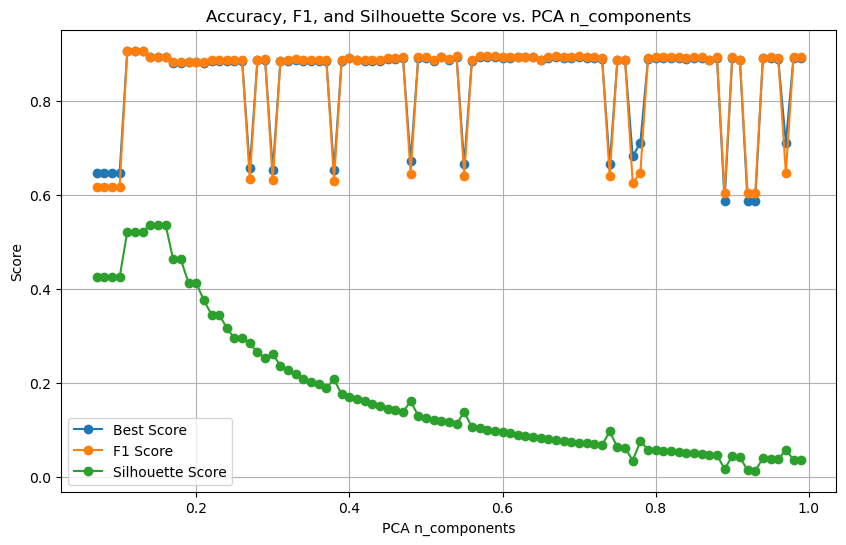

n_components = 0.10999999999999999 has the best accuracy: 0.90569


In [82]:
# standardize the features
scaler = StandardScaler()
vgg16_pt_fs_scaled = scaler.fit_transform(vgg16_pt_fs)

n_components_range = np.arange(0.07, 1.0, 0.01) 
best_scores = []  
f1_scores = []
silhouette_scores = []

for n_components in n_components_range:
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(vgg16_pt_fs_scaled)
    
    kmeans = KMeans(n_clusters=5, random_state=SEED)
    kmeans.fit(reduced_data)
    pred = kmeans.labels_
    
    print(f"PCA n_components: {n_components}")
    print(f'Number of features: {reduced_data.shape[1]}')
    
    best_score, f1, _, _ = label_permutation(y, pred)
    best_scores.append((n_components, best_score))
    f1_scores.append((n_components, f1))
    
    silhouette_scores.append((n_components, silhouette_score(reduced_data, pred)))
    print('')
    
n_components_list = [score[0] for score in best_scores]
acc_list = [score[1] for score in best_scores]

f1_components_list = [score[0] for score in f1_scores]
f1_list = [score[1] for score in f1_scores]

silhouette_components_list = [score[0] for score in silhouette_scores]
silhouette_list = [score[1] for score in silhouette_scores]

plt.figure(figsize=(10, 6))
plt.plot(n_components_list, acc_list, marker='o', label='Best Score')
plt.plot(f1_components_list, f1_list, marker='o', label='F1 Score')
plt.plot(silhouette_components_list, silhouette_list, marker='o', label='Silhouette Score')
plt.title('Accuracy, F1, and Silhouette Score vs. PCA n_components')
plt.xlabel('PCA n_components')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()

sorted_scores = sorted(best_scores, key=lambda x: x[1], reverse=True)
print(f'n_components = {sorted_scores[0][0]} has the best accuracy: {sorted_scores[0][1]:.5f}')


In [80]:
vgg16_pt_fs_scaled.shape

(13381, 4096)

In the plot above, we can observe the trends of **accuracy**, **f1 score**, and **Silhouette score** as they change with n_components in PCA. 

The original number of features was 4096, and setting the proportion of retained n_components from 0.07 to 0.99 allowed the features to be reduced to between 2 and 3071. The classification performance was not good with only 2 feature, but there was a significant improvement in performance at n_components=0.11, when the number of features was 3, the best accuracy of 0.90569 and an F1 score of 0.90649 were achieved. Subsequently, as the number of features increased, performance did not improve and fluctuated, which could be a sign of overfitting. 

During the phase after the peak where scores plateau without increasing, both accuracy and f1 score exhibit sudden drops at certain points. These intermittent declines may indicate that at these specific n_components values, crucial features of the data are either removed or noise is introduced, leading to a sudden drop in the performance. This could be attributed to that PCA is an unsupervised learning technique, which does not consider the labels of the data or the prediction task, and hence, it might remove variables that are very important for predicting the target variable or introduce variables that contain information irrelevant to the prediction task. This highlights the importance of carefully selecting the n_components when applying PCA.

On the other hand, the **Silhouette score** is an indicator of clustering quality, measuring the similarity of a sample to other samples in the same cluster compared to samples in different clusters. In the plot, the Silhouette score first increases and then decreases as the number of components increases, indicating that the quality of clustering deteriorates with an increase in the number of components.

Therefore, based on the above results, choosing n_components in the range of 0.11-0.16, corresponding to 3 or 4 features, would be a better selection.

**K-Means + PCA3**

After PCA, the number of features is reduced to 3
Best Accuracy: 0.90569
F1 Score: 0.90649
Cluster 0 - 4 corresponding to labels: ['horse', 'elephant', 'dog', 'cat', 'lion']
Silhouette Score: 0.52118
Confusion Matrix:
[[1977  620   64    0   27]
 [  35 2633    8    0   12]
 [  57    0 2562    1    7]
 [   0    0    2 2733    2]
 [  15  391   20    1 2214]]


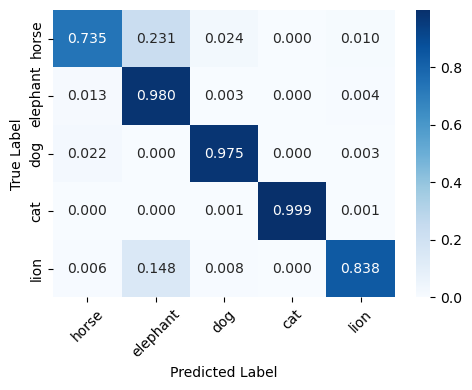

In [45]:
# reduce the number of features to 3
pca = PCA(n_components=3)
vgg16_pt_fs_pca = pca.fit_transform(vgg16_pt_fs_scaled)

kmeans = KMeans(n_clusters=5, random_state=SEED)
kmeans.fit(vgg16_pt_fs_pca)
pred = kmeans.labels_

print(f'After PCA, the number of features is reduced to {vgg16_pt_fs_pca.shape[1]}')
best_score, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_pca, pred):.5f}')
cm_plot(cm, best_labels)


After standardization and reducing the dimensionality to three features using PCA, not only did the performance not decrease, but both accuracy (0.90569) and F1 score (0.90649) improved. This processing enhances the model's performance and robustness.

#### Tuning
try various combinations of K-Means' hyperparameters.

In [46]:
params = {'kmeans__init': ['k-means++', 'random'], # initialization method
    'kmeans__n_init': [10, 15, 20], # number of initializations
    'kmeans__tol': [1e-4, 1e-3, 1e-2], # tolerance
    'kmeans__algorithm': ['elkan', 'lloyd'],  # k-means algorithm
          }
best_score = 0
best_params = None

for init, n_init, tol, alg in itertools.product(params['kmeans__init'], params['kmeans__n_init'], params['kmeans__tol'], params['kmeans__algorithm']):
    
    kmeans = KMeans(n_clusters=5, random_state=SEED, init=init, n_init=n_init, tol=tol, algorithm=alg)
    kmeans.fit(vgg16_pt_fs_pca)
    pred = kmeans.labels_
    score, _, _, _ = label_permutation(y, pred)
    if score > best_score:
        best_score = score
        best_params = {'init': init, 'n_init': n_init, 'tol': tol, 'algorithm': alg}
        print(f"{init}, {n_init}, {tol}, {alg} currently obtained the best score: {best_score:.5f}")
    print('')
        
print(f"Best Score: {best_score:.5f}")
print(f"Best Parameters: {best_params}")



Best Accuracy: 0.90643
F1 Score: 0.90721
Cluster 0 - 4 corresponding to labels: ['cat', 'horse', 'dog', 'lion', 'elephant']
k-means++, 10, 0.0001, elkan currently obtained the best score: 0.90643

Best Accuracy: 0.90643
F1 Score: 0.90721
Cluster 0 - 4 corresponding to labels: ['cat', 'horse', 'dog', 'lion', 'elephant']

Best Accuracy: 0.90546
F1 Score: 0.90632
Cluster 0 - 4 corresponding to labels: ['dog', 'cat', 'horse', 'elephant', 'lion']

Best Accuracy: 0.90546
F1 Score: 0.90632
Cluster 0 - 4 corresponding to labels: ['dog', 'cat', 'horse', 'elephant', 'lion']

Best Accuracy: 0.90404
F1 Score: 0.90495
Cluster 0 - 4 corresponding to labels: ['dog', 'cat', 'elephant', 'lion', 'horse']

Best Accuracy: 0.90404
F1 Score: 0.90495
Cluster 0 - 4 corresponding to labels: ['dog', 'cat', 'elephant', 'lion', 'horse']

Best Accuracy: 0.90584
F1 Score: 0.90664
Cluster 0 - 4 corresponding to labels: ['elephant', 'dog', 'cat', 'lion', 'horse']

Best Accuracy: 0.90584
F1 Score: 0.90664
Cluster 0 - 

Best Accuracy: 0.90643
F1 Score: 0.90721
Cluster 0 - 4 corresponding to labels: ['cat', 'horse', 'dog', 'lion', 'elephant']
Silhouette Score: 0.52115
Confusion Matrix:
[[2733    0    2    2    0]
 [   0 1983   64   28  613]
 [   1   57 2562    7    0]
 [   1   15   20 2222  383]
 [   0   37    8   14 2629]]


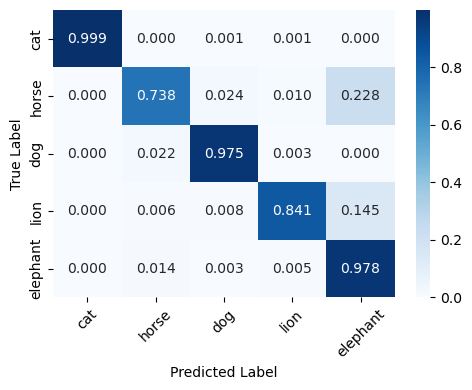

In [47]:
kmeans = KMeans(n_clusters=5, random_state=SEED, **best_params)
kmeans.fit(vgg16_pt_fs_pca)
pred = kmeans.labels_

best_score, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_pca, pred):.5f}')
cm_plot(cm, best_labels)

| Feature Extraction Method              | Clustering/Classification Method |  Accuracy | F1 Score | Silhouette Score |
|----------------------------------------|----------------------------------|----------|----------|------------------|
| VGG16                          | K-means                          |  0.85696  | 0.85748  | 0.12684          |
| VGG16 + PCA                   | K-means                          |  0.90569  | 0.90649  | 0.52118          |
| `VGG16 + PCA + Tuning`          | `K-means`                          |  `0.90643`  | `0.90721`  | `0.52115`          |



**Agglomerative Clustering + PCA**

The code below inspect how the performance of animal image classification using Agglomerative Clustering varies with changes in PCA n_components from 0.07 to 0.99. The number presents the percentage of features's information retained.

PCA n_components: 0.07
Number of features: 2
Best Accuracy: 0.79232
F1 Score: 0.78991
Cluster 0 - 4 corresponding to labels: ['elephant', 'lion', 'horse', 'cat', 'dog']

PCA n_components: 0.08
Number of features: 2
Best Accuracy: 0.79232
F1 Score: 0.78991
Cluster 0 - 4 corresponding to labels: ['elephant', 'lion', 'horse', 'cat', 'dog']

PCA n_components: 0.09
Number of features: 2
Best Accuracy: 0.79232
F1 Score: 0.78991
Cluster 0 - 4 corresponding to labels: ['elephant', 'lion', 'horse', 'cat', 'dog']

PCA n_components: 0.09999999999999999
Number of features: 2
Best Accuracy: 0.79232
F1 Score: 0.78991
Cluster 0 - 4 corresponding to labels: ['elephant', 'lion', 'horse', 'cat', 'dog']

PCA n_components: 0.10999999999999999
Number of features: 3
Best Accuracy: 0.84598
F1 Score: 0.84288
Cluster 0 - 4 corresponding to labels: ['elephant', 'dog', 'lion', 'cat', 'horse']

PCA n_components: 0.11999999999999998
Number of features: 3
Best Accuracy: 0.84598
F1 Score: 0.84288
Cluster 0 - 4 corre

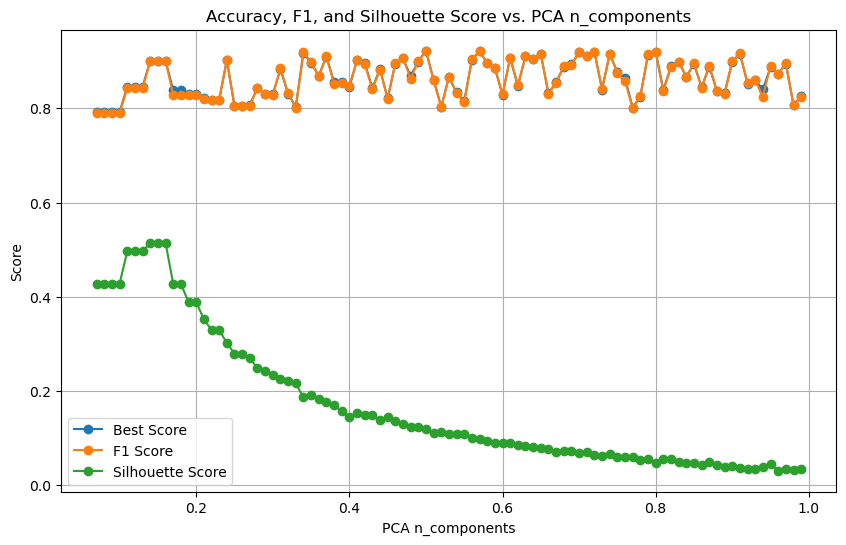

n_components = 0.4999999999999998 has the best accuracy: 0.92228.


In [161]:
n_components_range = np.arange(0.07, 1.0, 0.01) 
best_scores = []  
f1_scores = []
silhouette_scores = []

for n_components in n_components_range:
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(vgg16_pt_fs_scaled)
    
    agg = AgglomerativeClustering(n_clusters=5)
    agg.fit(reduced_data)
    pred = agg.labels_
    
    print(f"PCA n_components: {n_components}")
    print(f'Number of features: {reduced_data.shape[1]}')
    
    best_score, f1, _, _ = label_permutation(y, pred)
    best_scores.append((n_components, best_score))
    f1_scores.append((n_components, f1))
    
    silhouette_scores.append((n_components, silhouette_score(reduced_data, pred)))
    print('')
    
n_components_list = [score[0] for score in best_scores]
acc_list = [score[1] for score in best_scores]

f1_components_list = [score[0] for score in f1_scores]
f1_list = [score[1] for score in f1_scores]

silhouette_components_list = [score[0] for score in silhouette_scores]
silhouette_list = [score[1] for score in silhouette_scores]

plt.figure(figsize=(10, 6))
plt.plot(n_components_list, acc_list, marker='o', label='Best Score')
plt.plot(f1_components_list, f1_list, marker='o', label='F1 Score')
plt.plot(silhouette_components_list, silhouette_list, marker='o', label='Silhouette Score')
plt.title('Accuracy, F1, and Silhouette Score vs. PCA n_components')
plt.xlabel('PCA n_components')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()

sorted_scores = sorted(best_scores, key=lambda x: x[1], reverse=True)
print(f'n_components = {sorted_scores[0][0]} has the best accuracy: {sorted_scores[0][1]:.5f}.')


Even though the best accuracy occurs at n_components=0.5, this point will not be chosen due to apparent overfitting. 

The performance increases from a low point when the feature count rises from 2 to 4, reaching a peak of accuracy and F1 score. This indicates that at this level of dimensionality reduction, the data retains sufficient information for effective classification while also benefiting from reduced complexity. Beyond this optimal point, increasing the number of features does not lead to performance improvements but instead introduces fluctuations, likely indicative of overfitting where the model starts to 'memorize' the training data rather than learning to generalize from it.

Based on the observed results, setting n_components to retain 4 features appears to be the most appropriate choice for this task.

After PCA, the number of features is reduced to 4
Best Accuracy: 0.88200
F1 Score: 0.88277
Cluster 0 - 4 corresponding to labels: ['elephant', 'lion', 'dog', 'cat', 'horse']
Silhouette Score: 0.51950
Confusion Matrix:
[[2667   14    0    0    7]
 [ 458 2172    7    0    4]
 [   5    1 2621    0    0]
 [   1    3    1 2732    0]
 [1055   12   11    0 1610]]


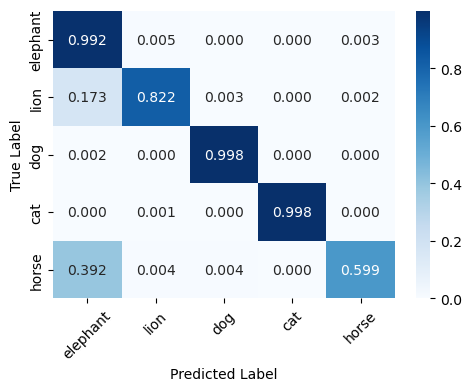

In [183]:
pca = PCA(n_components=4)
vgg16_pt_fs_pca = pca.fit_transform(vgg16_pt_fs_scaled)

agg = AgglomerativeClustering(n_clusters=5)
agg.fit(vgg16_pt_fs_pca)
pred = agg.labels_

print(f'After PCA, the number of features is reduced to {vgg16_pt_fs_pca.shape[1]}')
best_score, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_pca, pred):.5f}')
cm_plot(cm, best_labels)


#### Visualization

Set n_components=2 to visualize how the points were clustered.

Best Accuracy: 0.85031
F1 Score: 0.85001
Cluster 0 - 4 corresponding to labels: ['horse', 'dog', 'elephant', 'cat', 'lion']
Silhouette Score: 0.45434
Confusion Matrix:
[[2222  128  337    0    1]
 [ 112 2426   31   58    0]
 [ 220    7 2459    0    2]
 [   0    3    0 2733    1]
 [  26   16 1060    1 1538]]


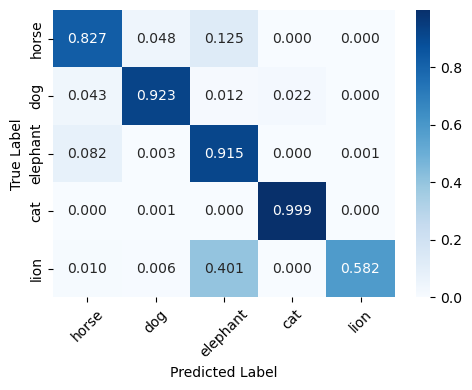

In [51]:
pca2 = PCA(n_components=2)  
vgg16_pt_fs_pca2 = pca2.fit_transform(vgg16_pt_fs_scaled)

agg = AgglomerativeClustering(n_clusters=5)
agg.fit(vgg16_pt_fs_pca2)
pred = agg.labels_

best_score, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_pca2, pred):.5f}')
cm_plot(cm, best_labels)


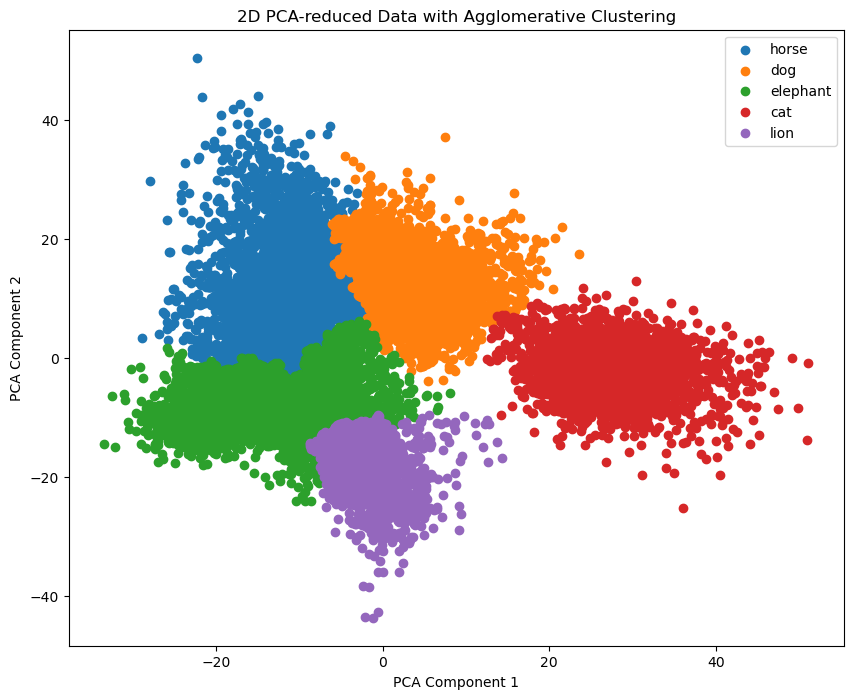

In [52]:
# plot 2D PCA-reduced data with Agglomerative Clustering 

label_mapping = {i: best_labels[i] for i in range(len(best_labels))}
mapped_labels = [label_mapping[label] for label in pred]
plt.figure(figsize=(10, 8))

for label in best_labels:
    plt.scatter(vgg16_pt_fs_pca2[np.array(mapped_labels) == label, 0], vgg16_pt_fs_pca2[np.array(mapped_labels) == label, 1], label=label)

plt.title('2D PCA-reduced Data with Agglomerative Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()


From the plot above, it can be observed that, aside from the cat category, which is well-separated, the other categories are not distinctly partitioned. In particular, the lion cluster is smaller and tends to misclassified as elephants.

### t-SNE

**t-distributed Stochastic Neighbor Embedding (t-SNE)** is a nonlinear dimensionality reduction technique, particularly suitable for visualizing high-dimensional data to two or three dimension. It excels at preserving the local structure of the original high-dimensional data points by transforming them to a lower-dimensional space where similar points remain close together and dissimilar points are placed far apart. 

**Agglomerative Cluster + t-SNE 2D**

Best Accuracy: 0.94320
F1 Score: 0.94336
Cluster 0 - 4 corresponding to labels: ['horse', 'dog', 'cat', 'elephant', 'lion']
Silhouette Score: 0.49892
Confusion Matrix:
[[2364    1    2  225   96]
 [   0 2624    0    1    2]
 [   0    0 2735    0    2]
 [ 146    0    0 2499   43]
 [  53    0    2  187 2399]]


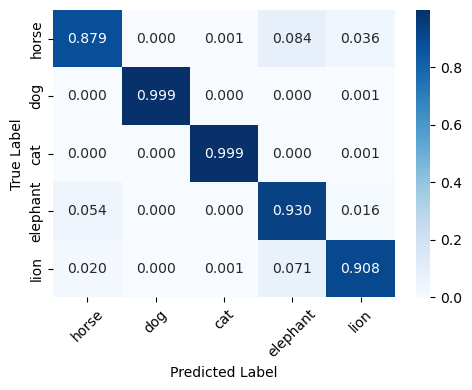

In [171]:
tsne = TSNE(n_components=2, init='random', random_state=SEED)
vgg16_pt_fs_tsne = tsne.fit_transform(vgg16_pt_fs_scaled)

agg = AgglomerativeClustering(n_clusters=5)
agg.fit(vgg16_pt_fs_tsne)
pred = agg.labels_

best_score, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_tsne, pred):.5f}')
cm_plot(cm, best_labels)


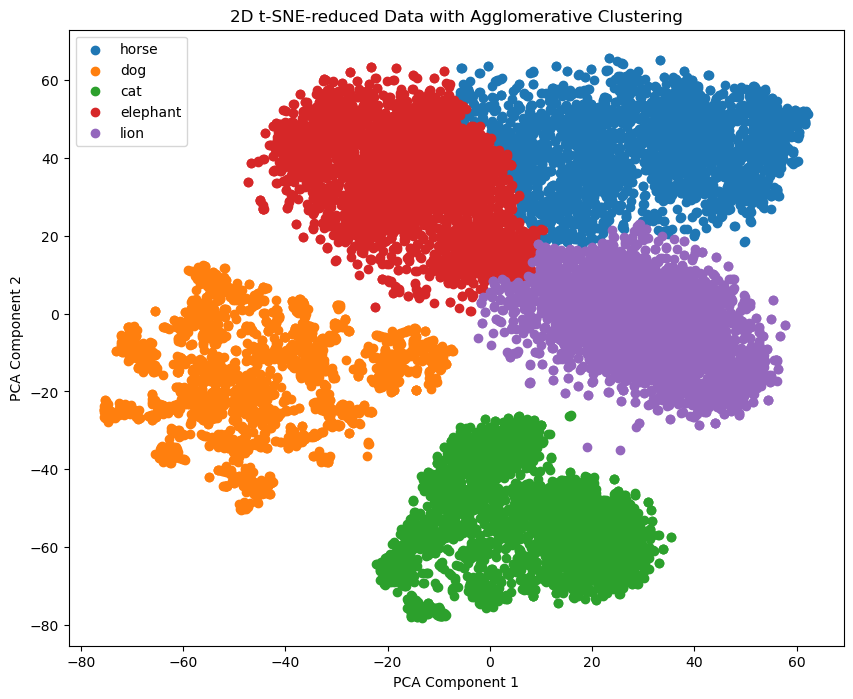

In [119]:
# plot 2D tsne-reduced data with Agglomerative Clustering

label_mapping = {i: best_labels[i] for i in range(len(best_labels))}
mapped_labels = [label_mapping[label] for label in pred]

plt.figure(figsize=(10, 8))

for label in best_labels:
    plt.scatter(vgg16_pt_fs_tsne[np.array(mapped_labels) == label, 0], vgg16_pt_fs_tsne[np.array(mapped_labels) == label, 1], label=label)

plt.title('2D t-SNE-reduced Data with Agglomerative Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()


Compared to 2D PCA, 2D t-SNE yielded better results with higher metric values and a higher Silhouette Score. From the plot above, it can be observed that cat and dog are well-separated into distinct clusters. However, horses, elephants, and lions do not have clear boundaries, indicating that images of these three categories are easily confused with each other. This is consistent with the results observed in the confusion matrix and from EDA.

**Agglomerative Cluster + t-SNE 3D**

I attempted to visualize the data in 3D to observe the structure of the clusters dynamically. However, the image is not rotatable. Since this is not the main focus of the project, I will address it later.

Best Accuracy: 0.87460
F1 Score: 0.87588
Cluster 0 - 4 corresponding to labels: ['lion', 'horse', 'dog', 'cat', 'elephant']
Silhouette Score: 0.32817
Confusion Matrix:
[[2579   33    0    7   22]
 [ 371 2206    1    6  104]
 [   2  366 2258    0    1]
 [   4    0    2 2731    0]
 [ 706   53    0    0 1929]]


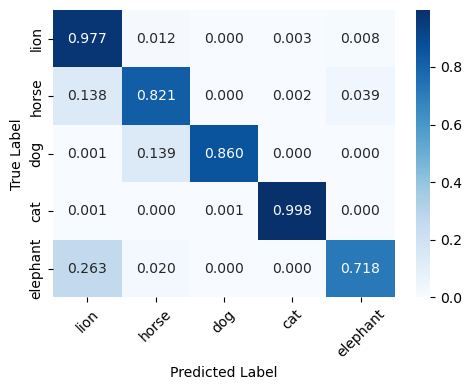

In [155]:
tsne = TSNE(n_components=3, init='random', random_state=SEED)
vgg16_pt_fs_tsne = tsne.fit_transform(vgg16_pt_fs_scaled)
agg = AgglomerativeClustering(n_clusters=5)
agg.fit(vgg16_pt_fs_tsne)
pred = agg.labels_

best_score, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_tsne, pred):.5f}')
cm_plot(cm, best_labels) 

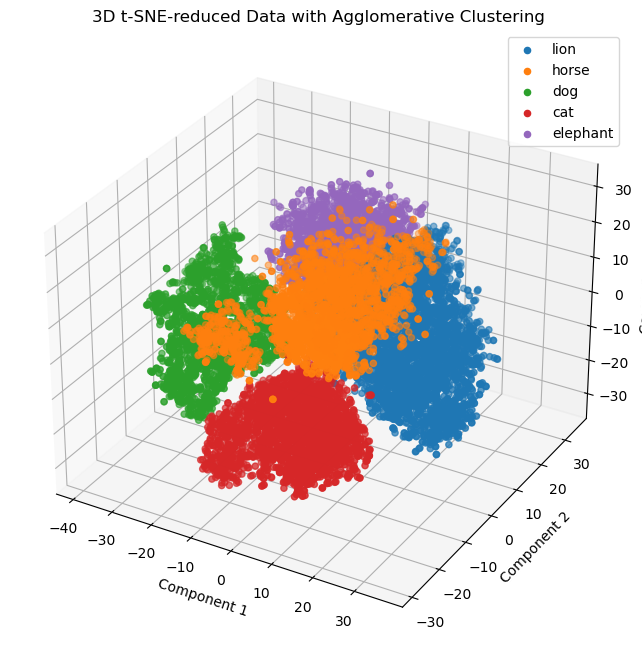

In [156]:
# plot 3D tsne-reduced data with Agglomerative Clustering

label_mapping = {i: best_labels[i] for i in range(len(best_labels))}
mapped_labels = [label_mapping[label] for label in pred]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in best_labels:
    ax.scatter(vgg16_pt_fs_tsne[np.array(mapped_labels) == label, 0], 
               vgg16_pt_fs_tsne[np.array(mapped_labels) == label, 1], 
               vgg16_pt_fs_tsne[np.array(mapped_labels) == label, 2], label=label)

ax.set_title('3D t-SNE-reduced Data with Agglomerative Clustering')
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.legend()
plt.show()


## Tuning

Tune **Agglomerative Cluster + PCA reduced data**

In [186]:
# Find the best score and parameters for Agglomerative Clustering + PCA reduced data

params = {'linkage': ['ward', 'complete', 'average', 'single'],
          'metric': ['euclidean', 'manhattan', 'cosine', 'l1', 'l2', 'cosine']
          }
best_score = 0
best_params = None

for link, met in itertools.product(params['linkage'], params['metric']):
    
    if link == 'ward' and met != 'euclidean':
        continue
    try:
        agg = AgglomerativeClustering(n_clusters=5, linkage=link, metric=met)
        agg.fit(vgg16_pt_fs_pca)
        pred = agg.labels_
        score, _, _, _ = label_permutation(y, pred)
        print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_pca, pred):.5f}')
        if score > best_score:
            best_score = score
            best_params = {'metric': met, 'linkage': link}
            print(f"{met} and {link} currently obtained the best score: {best_score:.5f}")
    except ValueError as e:
        print(f"Combination metric={met} and linkage={link} is not valid. Error: {e}")
    print('')

print(f"Best Score: {best_score:.5f}")
print(f"Best Parameters: {best_params}")

Best Accuracy: 0.88200
F1 Score: 0.88277
Cluster 0 - 4 corresponding to labels: ['elephant', 'lion', 'dog', 'cat', 'horse']
Silhouette Score: 0.51950
euclidean and ward currently obtained the best score: 0.88200

Best Accuracy: 0.88805
F1 Score: 0.89061
Cluster 0 - 4 corresponding to labels: ['horse', 'elephant', 'lion', 'cat', 'dog']
Silhouette Score: 0.52548
euclidean and complete currently obtained the best score: 0.88805

Best Accuracy: 0.58875
F1 Score: 0.56741
Cluster 0 - 4 corresponding to labels: ['dog', 'horse', 'lion', 'cat', 'elephant']
Silhouette Score: 0.25513

Best Accuracy: 0.84299
F1 Score: 0.84104
Cluster 0 - 4 corresponding to labels: ['lion', 'dog', 'horse', 'elephant', 'cat']
Silhouette Score: 0.39775

Best Accuracy: 0.58875
F1 Score: 0.56741
Cluster 0 - 4 corresponding to labels: ['dog', 'horse', 'lion', 'cat', 'elephant']
Silhouette Score: 0.25513

Best Accuracy: 0.88805
F1 Score: 0.89061
Cluster 0 - 4 corresponding to labels: ['horse', 'elephant', 'lion', 'cat', 

After tuning, the best combination of hyperparameters found so far is {'metric': 'euclidean', 'linkage': 'ward'}, which is the same as the default setting. The best score so far are accuracy: 0.92833, f1 score: 0.92897.

Best Accuracy: 0.91660
F1 Score: 0.91703
Cluster 0 - 4 corresponding to labels: ['elephant', 'dog', 'cat', 'lion', 'horse']
Silhouette Score: 0.51900
Confusion Matrix:
[[2628   12    0    7   41]
 [   2 2595    1    1   28]
 [   0    1 2732    4    0]
 [ 451   50    4 2117   19]
 [ 383   53    3   56 2193]]


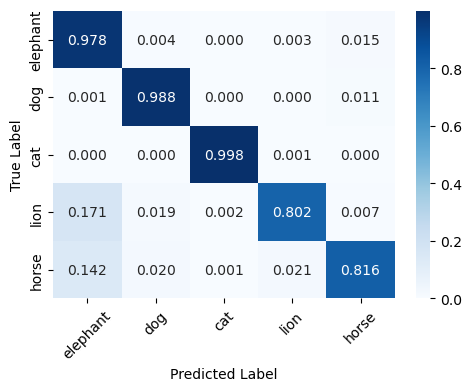

In [187]:
agg = AgglomerativeClustering(n_clusters=5, **best_params)
agg.fit(vgg16_pt_fs_pca)
pred = agg.labels_

_, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_pca, pred):.5f}')
cm_plot(cm, best_labels)

Tune **Agglomerative Cluster + t-SNE reduced data**

In [157]:
# Find the best score and parameters for Agglomerative Clustering + t-SNE reduced data

params = {'linkage': ['ward', 'complete', 'average', 'single'],
          'metric': ['euclidean', 'manhattan', 'cosine', 'l1', 'l2', 'cosine']
          }
best_score = 0
best_params = None

for link, met in itertools.product(params['linkage'], params['metric']):
    
    if link == 'ward' and met != 'euclidean':
        continue
    try:
        agg = AgglomerativeClustering(n_clusters=5, linkage=link, metric=met)
        agg.fit(vgg16_pt_fs_tsne)
        pred = agg.labels_
        score, _, _, _ = label_permutation(y, pred)
        print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_tsne, pred):.5f}')
        if score > best_score:
            best_score = score
            best_params = {'metric': met, 'linkage': link}
            print(f"{met} and {link} currently obtained the best score: {best_score:.5f}")
    except ValueError as e:
        print(f"Combination metric={met} and linkage={link} is not valid. Error: {e}")
    print('')

print(f"Best Score: {best_score:.5f}")
print(f"Best Parameters: {best_params}")

Best Accuracy: 0.87460
F1 Score: 0.87588
Cluster 0 - 4 corresponding to labels: ['lion', 'horse', 'dog', 'cat', 'elephant']
Silhouette Score: 0.32817
euclidean and ward currently obtained the best score: 0.87460

Best Accuracy: 0.85778
F1 Score: 0.85762
Cluster 0 - 4 corresponding to labels: ['elephant', 'cat', 'horse', 'dog', 'lion']
Silhouette Score: 0.31767

Best Accuracy: 0.87482
F1 Score: 0.87859
Cluster 0 - 4 corresponding to labels: ['horse', 'elephant', 'lion', 'dog', 'cat']
Silhouette Score: 0.32876
manhattan and complete currently obtained the best score: 0.87482

Best Accuracy: 0.88626
F1 Score: 0.88731
Cluster 0 - 4 corresponding to labels: ['elephant', 'cat', 'horse', 'lion', 'dog']
Silhouette Score: 0.33521
cosine and complete currently obtained the best score: 0.88626

Best Accuracy: 0.87482
F1 Score: 0.87859
Cluster 0 - 4 corresponding to labels: ['horse', 'elephant', 'lion', 'dog', 'cat']
Silhouette Score: 0.32876

Best Accuracy: 0.85778
F1 Score: 0.85762
Cluster 0 - 4

Here, the best hyperparameters found for agglomerative clustering and t-SNE reduced data are {'metric': 'cosine', 'linkage': 'average'}. 

Despite achieving better scores with PCA in the previous stage, using t-SNE reduced data with adjusting the parameters yields better performance in this stage.

Best Accuracy: 0.92758
F1 Score: 0.92745
Cluster 0 - 4 corresponding to labels: ['elephant', 'horse', 'dog', 'lion', 'cat']
Silhouette Score: 0.36202
Confusion Matrix:
[[2554  107    3   24    0]
 [ 299 2273   39   65   12]
 [   1    0 2624    2    0]
 [ 251  133    9 2232   16]
 [   3    0    4    1 2729]]


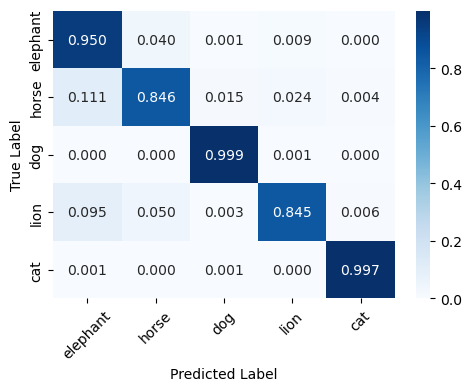

In [158]:
agg = AgglomerativeClustering(n_clusters=5, **best_params)
agg.fit(vgg16_pt_fs_tsne)
pred = agg.labels_

_, _, best_labels, cm = label_permutation(y, pred)
print(f'Silhouette Score: {silhouette_score(vgg16_pt_fs_tsne, pred):.5f}')
cm_plot(cm, best_labels)

| Feature Extraction Method              | Clustering/Classification Method |  Accuracy | F1 Score | Silhouette Score |
|----------------------------------------|----------------------------------|----------|----------|------------------|
| VGG16                          | Agglomerative Clustering         |  0.77864  | 0.76939  | 0.13374          |
| VGG16 + PCA                   | Agglomerative Clustering         |  0.88200  | 0.88277  | 0.51950          |
| `VGG16 + PCA + Tuning`          | `Agglomerative Clustering`         |  `0.91660`  | `0.91703`  | `0.51900`          |
| VGG16 + t-SNE                 | Agglomerative Clustering         |  0.87460  | 0.87588  | 0.32817          |
| `VGG16 + t-SNE + Tuning`        | `Agglomerative Clustering`         |  `0.92758`  | `0.92745`  | `0.36202`          |


Finally, the best performance achieved using the unsupervised method is an accuracy of 0.92758 and an F1 score of 0.92745. From the confusion matrix results, it can be observed that cats and dogs are both correctly classified with a score above 0.99, while elephant achieve a 0.95 correct classification rate. Lion and horse also achieve scores above 0.84, showing significant improvement.


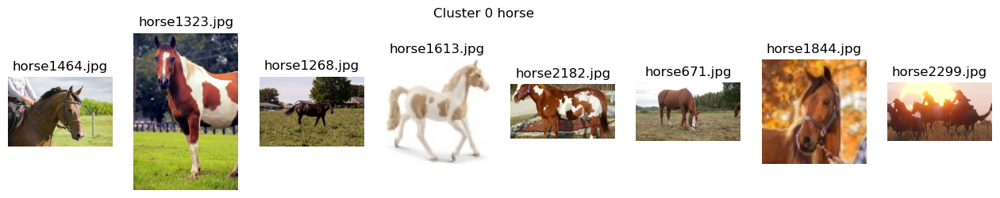

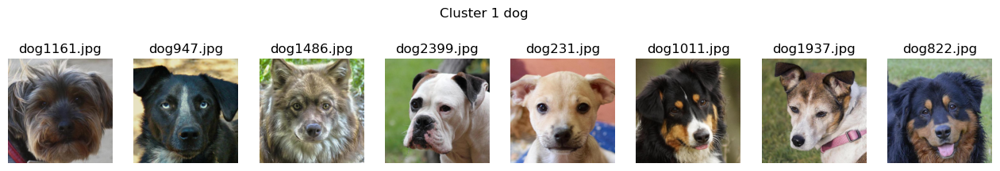

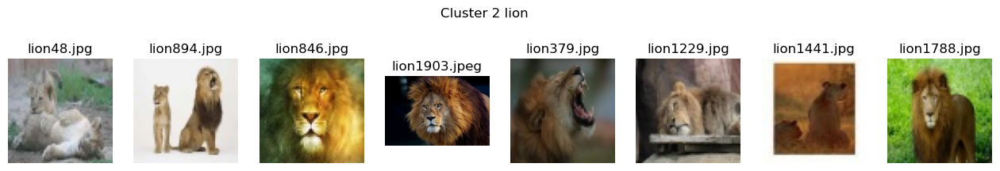

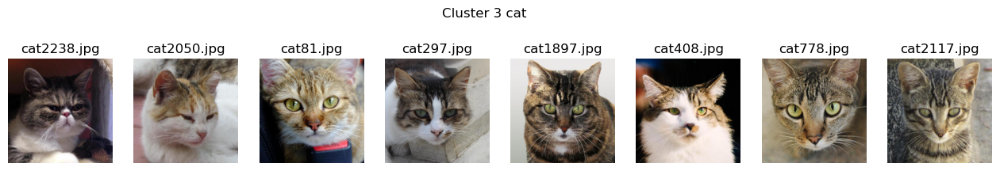

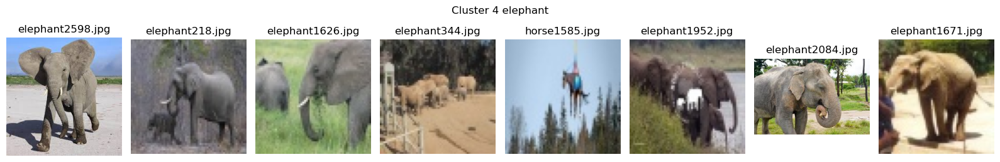

In [199]:
# disply random images clustered by Agglomerative Clustering + t-SNE reduced data
random_images_from_clusters(images_csv, pred, best_labels)

## Summary for Unsupervised Learning

During the model training phase, the quality of the image data is crucial. Whether the data is well-cleaned and provided with correct and appropriate image training greatly influences the model's performance. The feature extraction stage is also vital; extracting the necessary features will critically impact model performance. Additionally, implementing appropriate dimensionality reduction can help avoid overfitting and even improve performance, as can tuning. These are some areas where the model can be further improved in the future.

| Feature Extraction Method              | Clustering/Classification Method |  Accuracy | F1 Score | Silhouette Score |
|----------------------------------------|----------------------------------|----------|----------|------------------|
| Color Histogram HSV                    | K-means                          |  0.28100  | 0.22006  | 0.14721          |
| Grayscale Texture                      | K-means                          |  0.34564  | 0.28369  | 0.47389          |
| Color Histogram + Grayscale Texture    | K-means                          |  0.34549  | 0.28357  | 0.47378          |
| VGG16_Keras                            | K-means                          |  0.67409  | 0.62173  | 0.10764          |
| VGG16_PyTorch                          | K-means                          |  0.85696  | 0.85748  | 0.12684          |
| VGG16_PyTorch + PCA                   | K-means                          |  0.90569  | 0.90649  | 0.52118          |
| `VGG16_PyTorch + PCA + Tuning`          | `K-means`                          |  `0.90643`  | `0.90721`  | `0.52115`          |
| VGG16_PyTorch                          | Agglomerative Clustering         |  0.77864  | 0.76939  | 0.13374          |
| VGG16_PyTorch + PCA                   | Agglomerative Clustering         |  0.88200  | 0.88277  | 0.51950          |
| `VGG16_PyTorch + PCA + Tuning`          | `Agglomerative Clustering`         |  `0.91660`  | `0.91703`  | `0.51900`          |
| VGG16_PyTorch + t-SNE                 | Agglomerative Clustering         |  0.87460  | 0.87588  | 0.32817          |
| `VGG16_PyTorch + t-SNE + Tuning`        | `Agglomerative Clustering`         |  `0.92758`  | `0.92745`  | `0.36202`          |


# Supervised Classifier
---

In the following, supervised learning is employed, where the model is trained using features and labels from the training set, and tested on unknown data in the validation data. Although the supervised classifier calculates metrics for both the training data and validation data, it cannot directly compare one of these metric values with those of unsupervised clustering, as the resources and information provided are not the same. 

### Validation Data

In [22]:
val_path = 'data_animals/val'

create_csv_for_images(val_path, 'val_images_labels.csv')
val_images_csv = pd.read_csv(os.path.join(val_path, 'val_images_labels.csv'))
val_images_csv.shape

(1497, 3)

In [63]:
# count the number of files in the directory
count_files_in_directory(val_path)

root: data_animals/val, dirs: 5, files: 1
root: data_animals/val/cat, dirs: 0, files: 300
root: data_animals/val/dog, dirs: 0, files: 300
root: data_animals/val/horse, dirs: 0, files: 300
root: data_animals/val/lion, dirs: 0, files: 298
root: data_animals/val/elephant, dirs: 0, files: 299

Total image files (.jpg, .png, jpeg): 1497


In [64]:
# count the number of images in each category
val_images_csv['label'].value_counts()

label
cat         300
dog         300
horse       300
elephant    299
lion        298
Name: count, dtype: int64

Validation data is also balanced, same as train data.

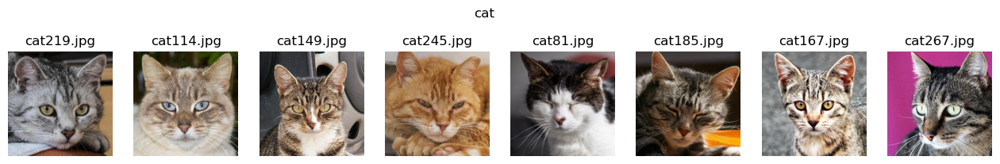

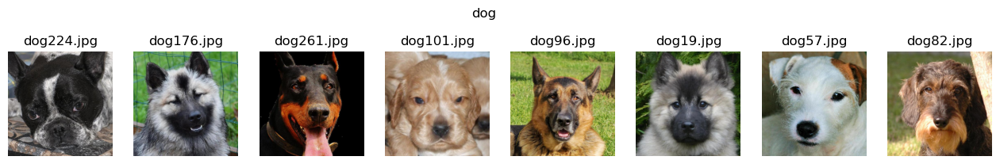

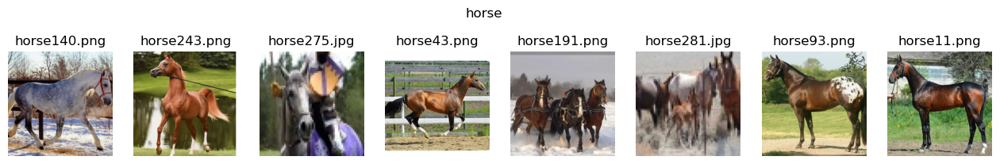

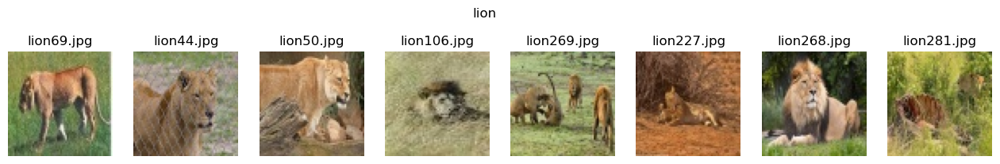

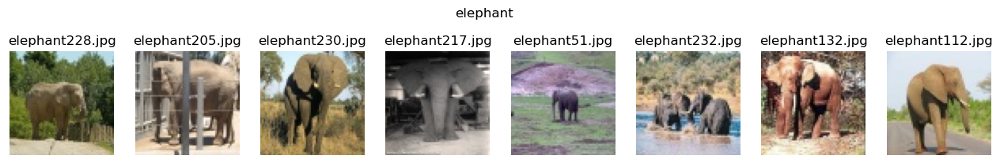

In [65]:
# display random images from validation dataset
random_images_display(val_path, categories)

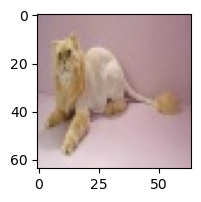

In [66]:
# Show a cat image in the lion category
cat_in_lion = os.path.join(val_path, 'lion/lion100.jpg')
img = plt.imread(cat_in_lion)
plt.figure(figsize=(2, 2)) 
plt.imshow(img)

Found a cat in the lion category... Since it is in the validation set, I'll not remove it.

## k-NN

**K-Nearest Neighbors (k-NN)** is an instance-based learning where the classification is determined by a majority vote of its K nearest neighbors. When classifying a new image, it looks for the K samples in the training set that are most similar / nearest in features to that image and decides the new image's category based on these neighbors' categories.

The following uses features extracted with VGG16 to train a k-NN model.

In [15]:
val_vgg16_pt_fs, val_y = images_load_and_feature_extract(val_images_csv, 'VGG16_PT', model=model_pt)

Training Accuracy:  0.9701816007772215
Validation Accuracy:  0.9619238476953907
Training F1 Score:  0.9701598558686353
Validation F1 Score:  0.9620961100013177
Validation Confusion Matrix:
Confusion Matrix:
[[300   0   0   0   0]
 [  1 299   0   0   0]
 [  0   0 286   4   9]
 [  0   0  14 279   7]
 [  0   0  20   2 276]]


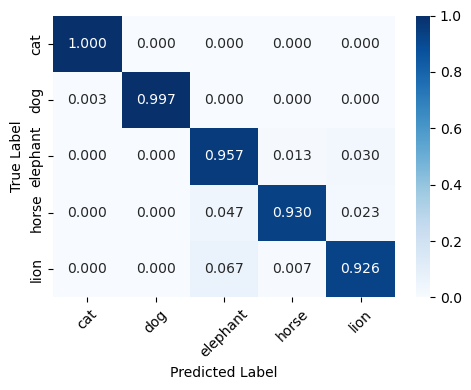

In [200]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(vgg16_pt_fs, y)
pred_train = knn.predict(vgg16_pt_fs)
pred = knn.predict(val_vgg16_pt_fs)

print("Training Accuracy: ", accuracy_score(y, pred_train))
print("Validation Accuracy: ", accuracy_score(val_y, pred))
print("Training F1 Score: ", f1_score(y, pred_train, average='weighted'))
print("Validation F1 Score: ", f1_score(val_y, pred, average='weighted'))

print('Validation Confusion Matrix:')
cm = confusion_matrix(val_y, pred)
cm_plot(cm, knn.classes_)

First attempt at supervised learning with KNN: the model shows good performance on both the training and validation datasets. For the training set, both accuracy and F1 scores are above 0.97, while for the validation set, it is around 0.962.

In [26]:
# Function to display images corresponding to the predicted category
def random_images_from_pred(pred_csv, pred_col):
    categories = pred_csv[pred_col].unique()
    n_images = 8
     
    for i, category in enumerate(categories):
        category_df = pred_csv[pred_csv[pred_col] == category]
        n_samples = min(len(category_df), n_images)
        fig, axs = plt.subplots(1, n_images, figsize=(16, 2.5))
        fig.suptitle(category)
        if n_samples > 0: 
            sampled_df = category_df.sample(n=n_samples, replace=True) 
            for j in range(n_images):
                img_path = sampled_df.iloc[j]['img_path']
                img = plt.imread(img_path)
                axs[j].imshow(img)
                axs[j].set_title(sampled_df.iloc[j]['img_name'])
                axs[j].axis('off')
        else:
            for j in range(n_images):
                axs[j].axis('off')

    plt.tight_layout()
    plt.show()


In [70]:
# create a new column for the predicted label
val_img_csv_pred = val_images_csv.copy()
val_img_csv_pred['pred_knn'] = pred


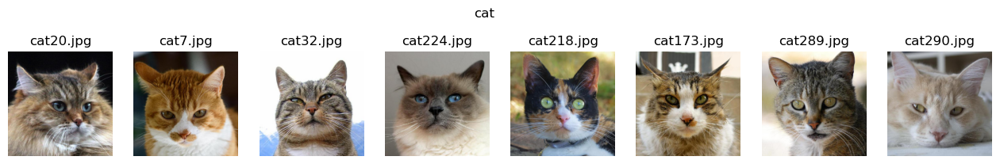

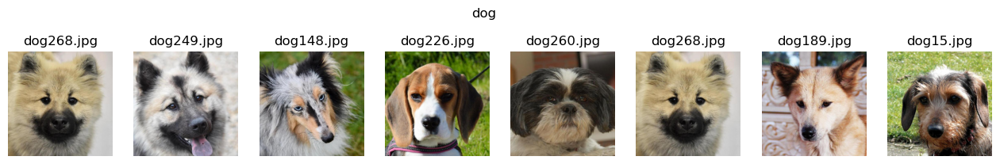

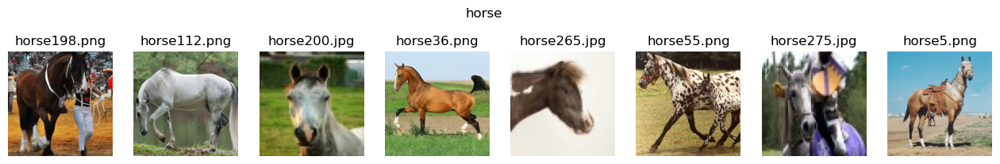

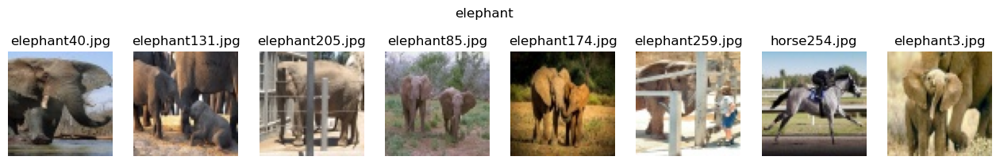

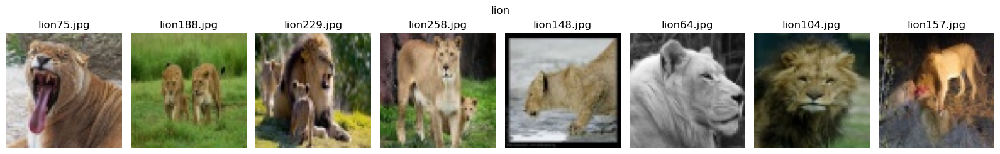

In [71]:
# display random images from the predicted categories for validation dataset
random_images_from_pred(val_img_csv_pred, 'pred_knn')

## SVM

**Support Vector Machine (SVM)** is a supervised learning algorithm to find a hyperplane that separates the data points of different classes as much as possible. The hyperplane is chosen based on maximizing the margin, which is the distance between the classes' nearest points (support vectors) to the hyperplane. 

The following uses features extracted with VGG16 to train a SVM model.

Training Accuracy:  0.9890890068006876
Validation Accuracy:  0.9766199064796259
Training F1 Score:  0.9890955642095371
Validation F1 Score:  0.9766462131188037
Validation Confusion Matrix:
Confusion Matrix:
[[299   0   0   0   1]
 [  0 300   0   0   0]
 [  0   0 291   4   4]
 [  0   0   5 291   4]
 [  0   0  14   3 281]]


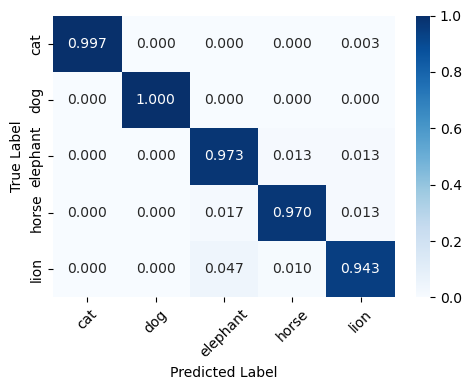

In [201]:
# Support Vector Classifier 
svm = SVC(random_state=SEED)
svm.fit(vgg16_pt_fs, y)
pred_train = svm.predict(vgg16_pt_fs)
pred = svm.predict(val_vgg16_pt_fs)

print("Training Accuracy: ", accuracy_score(y, pred_train))
print("Validation Accuracy: ", accuracy_score(val_y, pred))
print("Training F1 Score: ", f1_score(y, pred_train, average='weighted'))
print("Validation F1 Score: ", f1_score(val_y, pred, average='weighted'))

print('Validation Confusion Matrix:')
cm = confusion_matrix(val_y, pred)
cm_plot(cm, knn.classes_)

Using SVC resulted in better outcomes compared to k-NN, with the training data's accuracy and F1 score being approximately 0.9891, and the validation set being around 0.9766. There was slight improvement in distinguishing between the three easily confused categories: elephant, horse, and lion.

In [73]:
#val_img_csv_pred = val_images_csv.copy()
val_img_csv_pred['pred_svm'] = pred

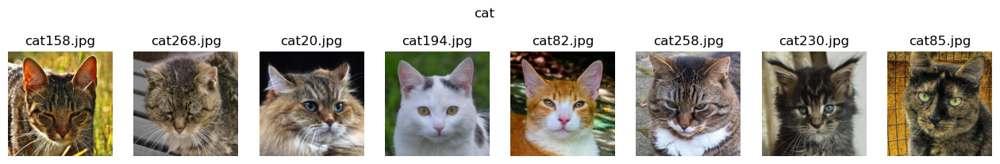

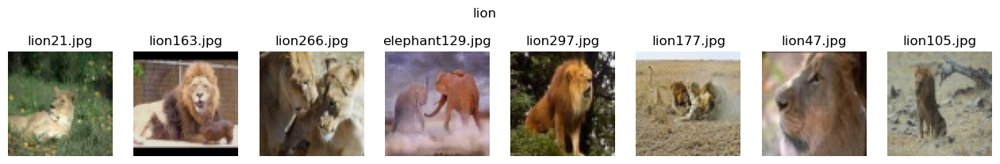

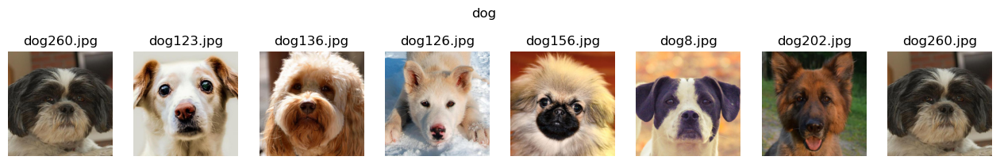

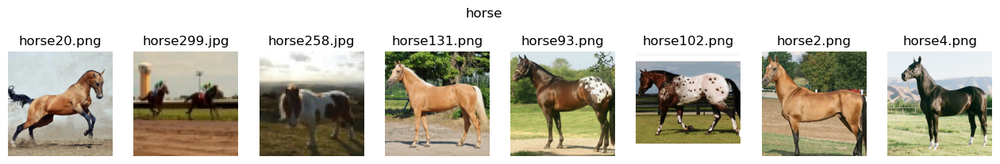

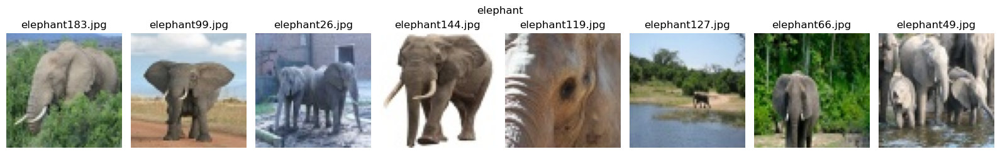

In [74]:
random_images_from_pred(val_img_csv_pred, 'pred_svm')

### PCA

Before applying PCA for dimensionality reduction, I'd like to first understand the trend of the accuracy of the training dataset and validation dataset as the number of PCA components increases.

In [18]:
val_vgg16_pt_fs_scaled = scaler.transform(val_vgg16_pt_fs)

PCA n_components: 0.1
Training Accuracy: 0.90501
Validation Accuracy: 0.91316

PCA n_components: 0.11
Training Accuracy: 0.94328
Validation Accuracy: 0.94055

PCA n_components: 0.12
Training Accuracy: 0.94328
Validation Accuracy: 0.94055

PCA n_components: 0.13
Training Accuracy: 0.94328
Validation Accuracy: 0.94055

PCA n_components: 0.13999999999999999
Training Accuracy: 0.95262
Validation Accuracy: 0.94656

PCA n_components: 0.14999999999999997
Training Accuracy: 0.95262
Validation Accuracy: 0.94656

PCA n_components: 0.15999999999999998
Training Accuracy: 0.95262
Validation Accuracy: 0.94656

PCA n_components: 0.16999999999999998
Training Accuracy: 0.95807
Validation Accuracy: 0.94656

PCA n_components: 0.17999999999999997
Training Accuracy: 0.95807
Validation Accuracy: 0.94656

PCA n_components: 0.18999999999999995
Training Accuracy: 0.96062
Validation Accuracy: 0.95057

PCA n_components: 0.19999999999999996
Training Accuracy: 0.96062
Validation Accuracy: 0.95057

PCA n_components

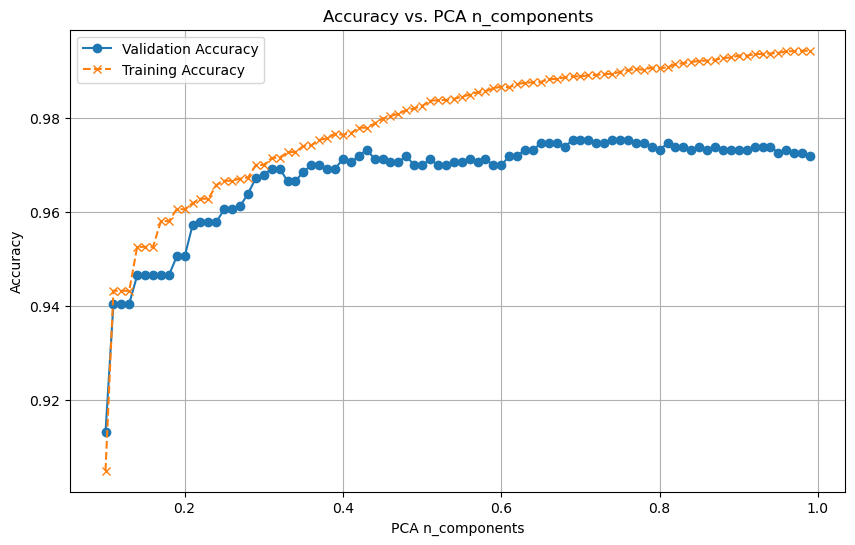

n_components = 0.6899999999999997 has the best accuracy: 0.97528 for validation set.


In [83]:
n_components_range = np.arange(0.1, 1.0, 0.01)
best_scores = []  
train_scores = [] 

for n_components in n_components_range:
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(vgg16_pt_fs_scaled)  
    reduced_val_data = pca.transform(val_vgg16_pt_fs_scaled)  

    svm = SVC(random_state=SEED)
    svm.fit(reduced_data, y) 
    train_pred = svm.predict(reduced_data)  
    val_pred = svm.predict(reduced_val_data)  
    
    train_acc = accuracy_score(y, train_pred)  
    val_acc = accuracy_score(val_y, val_pred)  
    
    train_scores.append((n_components, train_acc)) 
    best_scores.append((n_components, val_acc))
    
    print(f'PCA n_components: {n_components}')
    print(f'Training Accuracy: {train_acc:.5f}')
    print(f'Validation Accuracy: {val_acc:.5f}')
    print('')

n_components_list = [score[0] for score in best_scores]
val_acc_list = [score[1] for score in best_scores]
train_acc_list = [score[1] for score in train_scores]

plt.figure(figsize=(10, 6))
plt.plot(n_components_list, val_acc_list, marker='o', label='Validation Accuracy')
plt.plot(n_components_list, train_acc_list, marker='x', linestyle='--', label='Training Accuracy')
plt.title('Accuracy vs. PCA n_components')
plt.xlabel('PCA n_components')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

sorted_scores = sorted(best_scores, key=lambda x: x[1], reverse=True)
print(f'n_components = {sorted_scores[0][0]} has the best accuracy: {sorted_scores[0][1]:.5f} for validation set.')


Even though the accuracy of the training data can reach 0.9943 at n_components=0.99, or the validation data can achieve 0.97528 at n_components=0.69, here I would choose to set n_components=0.43. Although the accuracy of the training set continues to increase beyond this point, the accuracy of the validation data clearly slows down and does not show significant improvement afterwards. Setting to retain 43% of the original information, could maintain high accuracy while avoiding overfitting.

Training Accuracy:  0.9779538151109782
Validation Accuracy:  0.9732798931195725
Training F1 Score:  0.9779627301783286
Validation F1 Score:  0.9732810023385373
Validation Confusion Matrix:
Confusion Matrix:
[[299   0   0   0   1]
 [  0 300   0   0   0]
 [  0   0 286  10   3]
 [  0   0   4 293   3]
 [  0   0  13   6 279]]


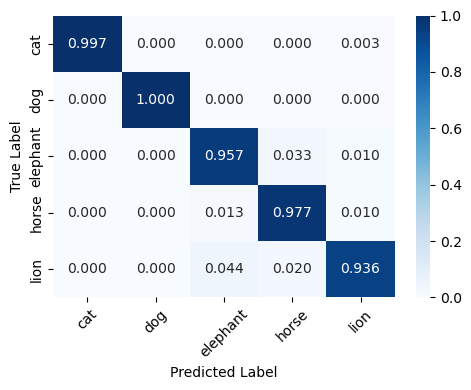

In [77]:
# set to retain 43% of the variance
pca = PCA(n_components=0.43)
vgg16_pt_fs_pca = pca.fit_transform(vgg16_pt_fs_scaled)
val_vgg16_pt_fs_pca = pca.transform(val_vgg16_pt_fs_scaled)

svm = SVC(random_state=SEED)
svm.fit(vgg16_pt_fs_pca, y)
pre_train = svm.predict(vgg16_pt_fs_pca)
pred = svm.predict(val_vgg16_pt_fs_pca)

print("Training Accuracy: ", accuracy_score(y, pre_train))
print("Validation Accuracy: ", accuracy_score(val_y, pred))
print("Training F1 Score: ", f1_score(y, pre_train, average='weighted'))
print("Validation F1 Score: ", f1_score(val_y, pred, average='weighted'))

print('Validation Confusion Matrix:')
cm = confusion_matrix(val_y, pred)
cm_plot(cm, svm.classes_)

Choosing n_components=0.43, although it might slightly decrease the accuracy and F1 score, can reduce the demand for computational resources and training time. Moreover, the model may become more robust to noise and outliers in the training data, which in turn could improve the model's generalization ability.

## Tuning

In [78]:
TUNING = False

if TUNING:

    space = {
        'C': hp.uniform('C', 0.001, 50.0),  
        'kernel': hp.choice('kernel', ['linear', 'rbf', 'poly', 'sigmoid']), 
        'gamma': hp.choice('gamma', ['scale', 'auto', hp.uniform('gamma_uniform', 0.0001, 10.0)]),  
        'degree': hp.choice('degree', range(1, 6))  
    }

    def objective(params):
        svc = SVC(**params, random_state=SEED)
        best_score = cross_val_score(svc, vgg16_pt_fs_pca, y, scoring='accuracy', cv=5).mean()
        return {'loss': -best_score, 'status': STATUS_OK}

    trials = Trials()
    best = fmin(fn=objective,
                space=space,
                algo=tpe.suggest,
                max_evals=300,
                trials=trials)

else:
    
    # best = {'C': 3.572477500638837, 'degree': 2, 'gamma': 0, 'kernel': 2} # 0.9793, 0.9706
    # best = {'C': 3.815131394819408, 'degree': 0, 'gamma': 0, 'kernel': 1} # 0.9849, 0.9733
    best = {'C': 3.777299825561273, 'degree': 1, 'gamma': 0, 'kernel': 1} # 0.9849, 0.9733

print(best)


  0%|          | 0/300 [00:00<?, ?trial/s, best loss=?]

100%|██████████| 300/300 [3:25:57<00:00, 41.19s/trial, best loss: -0.9697333985514651]   
{'C': 3.777299825561273, 'degree': 1, 'gamma': 0, 'kernel': 1}


Training Accuracy:  0.98490396831328
Validation Accuracy:  0.9732798931195725
Training F1 Score:  0.9849124628869189
Validation F1 Score:  0.9733078213031594
Validation Confusion Matrix:
Confusion Matrix:
[[299   0   0   0   1]
 [  0 300   0   0   0]
 [  0   0 286   9   4]
 [  0   0   6 292   2]
 [  0   0  14   4 280]]


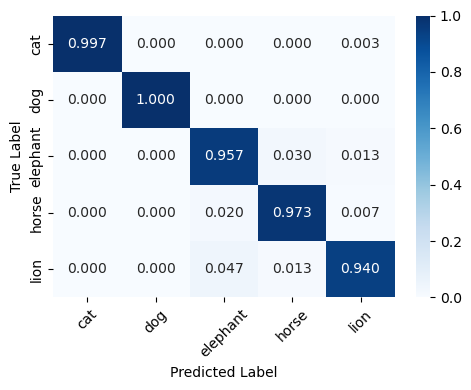

In [84]:
best_params = {
    'C': best['C'],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'][best['kernel']],
    'gamma': ['scale', 'auto', hp.uniform('gamma_uniform', 0.0001, 10.0)][best['gamma']] if best['gamma'] < 2 else best['gamma_uniform'],  # 对 gamma 的处理稍微复杂，需要特别注意
    'degree': best['degree'] 
}

# obtained by GridSearchCV
# best_params = {'C': 1, 'degree': 2, 'gamma': 'scale', 'kernel': 'poly'} # 0.97459, 0.96927
# best_params = {'C': 1.8124021706444107, 'degree': 1, 'gamma': 'scale', 'kernel': 'poly'} # 0.96914, 0.96727
# best_params = {'C': 3, 'degree': 1, 'gamma': 'scale', 'kernel': 'rbf'} # 0.98371, 0.97328

svm = SVC(random_state=SEED, **best_params)
svm.fit(vgg16_pt_fs_pca, y)
pre_train = svm.predict(vgg16_pt_fs_pca)
pred = svm.predict(val_vgg16_pt_fs_pca)

print("Training Accuracy: ", accuracy_score(y, pre_train))
print("Validation Accuracy: ", accuracy_score(val_y, pred))
print("Training F1 Score: ", f1_score(y, pre_train, average='weighted'))
print("Validation F1 Score: ", f1_score(val_y, pred, average='weighted'))

print('Validation Confusion Matrix:')
cm = confusion_matrix(val_y, pred)
cm_plot(cm, svm.classes_)


In [24]:
val_img_csv_pred['pred_svm_final'] = pred


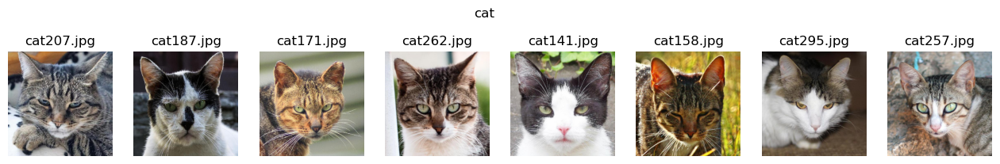

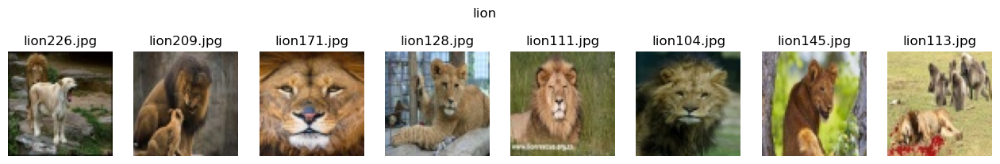

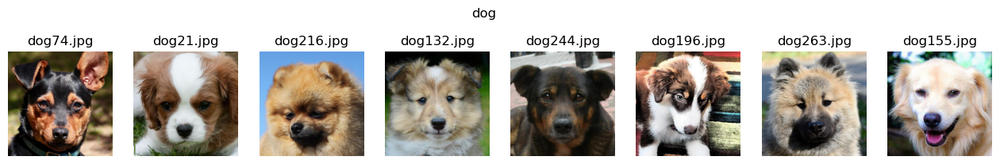

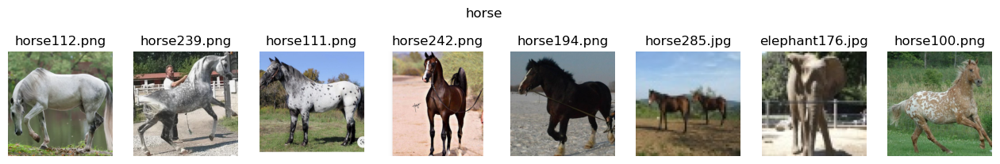

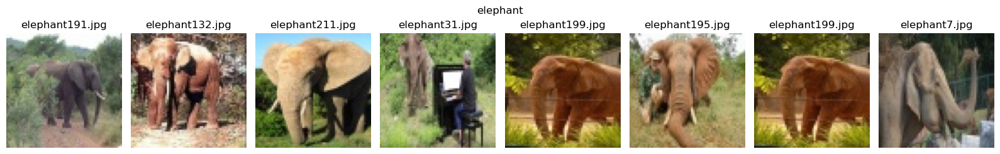

In [33]:
random_images_from_pred(val_img_csv_pred, 'pred_svm_final')

# Summary 

| Feature Extraction Method              | Clustering/Classification Method | Dataset | Accuracy | F1 Score | Silhouette Score |
|----------------------------------------|----------------------------------|---------|----------|----------|------------------|
| Color Histogram HSV                    | K-means                          | Train   | 0.28100  | 0.22006  | 0.14721          |
| Grayscale Texture                      | K-means                          | Train   | 0.34564  | 0.28369  | 0.47389          |
| Color Histogram + Grayscale Texture    | K-means                          | Train   | 0.34549  | 0.28357  | 0.47378          |
| VGG16_Keras                            | K-means                          | Train   | 0.67409  | 0.62173  | 0.10764          |
| VGG16_PyTorch                          | K-means                          | Train   | 0.85696  | 0.85748  | 0.12684          |
| VGG16 + PCA                   | K-means                          | Train   | 0.90569  | 0.90649  | 0.52118          |
| VGG16 + PCA + Tuning          | K-means                          | Train   | 0.90643  | 0.90721  | 0.52115          |
| VGG16                          | Agglomerative Clustering         | Train   | 0.77864  | 0.76939  | 0.13374          |
| VGG16 + PCA                   | Agglomerative Clustering         | Train   | 0.88200  | 0.88277  | 0.51950          |
| VGG16 + PCA + Tuning          | Agglomerative Clustering         | Train   | 0.91660  | 0.91703  | 0.51900          |
| VGG16 + t-SNE                 | Agglomerative Clustering         | Train   | 0.87460  | 0.87588  | 0.32817          |
| `VGG16 + t-SNE + Tuning`        | `Agglomerative Clustering`         | `Train`   | `0.92758`  | `0.92745`  | 0.36202          |
| VGG16                          | KNN                              | Train   | 0.97018  | 0.97016  | -         |
| VGG16                         | KNN                              | Valid   | 0.96192  | 0.96210  | -         |
| VGG16                          | SVM                              | Train   | 0.98909  | 0.98910  | -         |
| VGG16                          | SVM                              | Valid   | 0.97662  | 0.97665  | -         |
| VGG16 + PCA                | SVM                              | Train   | 0.97795  | 0.97796  | -         |
| VGG16 + PCA                | SVM                              | Valid   | 0.97328  | 0.97328  | -         |
| `VGG16 + PCA + Tuning`       | `SVM`                              | `Train`   | `0.98490`  | `0.98491`  | -         |
| `VGG16 + PCA + Tuning`       | `SVM`                              | `Valid`   | `0.97328`  | `0.97331`  | -         |

The results of using different feature extraction, dimensionality reduction, and clustering methods have been organized above. Among them, the method using VGG16_PyTorch for feature extraction combined with SVC for classification achieved the highest accuracy and F1 score. This indicates that features extracted by deep learning models (such as VGG16) are more effective than traditional color histograms or grayscale texture features, and that supervised learning (K-NN, SVC) performs better in this image recognition task than unsupervised learning (K-means, Agglomerative Clustering, DBSCAN).

Dimensionality reduction can decrease the dimensions of the feature space while retaining the largest variance. This not only reduces the computational burden but also reduces noise and improves the performance of clustering and classification algorithms. Prior to using unsupervised learning's k-means and agglomerative clustering for classification, dimensionality reduction using PCA and t-SNE both contributed to improved classification performance, and the increase in Silhouette score also indicates that it helps improve clustering quality. However, for supervised learning models, the benefits of dimensionality reduction were not directly reflected by the numbers at this stage, but it can help the model avoid overfitting, increase robustness, and improve generalization ability.

Appropriate parameter tuning can allow the model to better adapt to the specific characteristics of the dataset. From the results in the table, both supervised and unsupervised learning can improve model performance through tuning.


### Directions for Improvement

- Perform more diversified data augmentation and optimize preprocessing procedures before training to enhance the model's generalization ability on new data.

- Explore more effective methods of feature extraction.

- Try using other more advanced dimensionality reduction techniques to better maintain the local and global structure of the data.

- Conduct more detailed and comprehensive parameter tuning to find the optimal model configuration.

- Attempt to combine multiple feature extraction and classification/clustering methods, such as ensemble learning, to improve the model's stability and accuracy.
